Use `word2vec` embeddings as text representation.

# Reading Data

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')
%matplotlib inline

In [2]:
data = pd.read_csv('./data/rotten_tomatoes_20200726.csv', 
                            index_col=0,header=0, 
                            encoding = "utf8")
data.head(2)

,text,Action and Adventure,Animation,Art House and International,Comedy,Drama,Horror,Kids and Family,Musical and Performing Arts,Mystery and Suspense,Romance,Science Fiction and Fantasy,fresh,rotten,Other
0,A distinctly gallows take on contemporary fina...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1,0,0
1,It's an allegory in search of a meaning that n...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0,1,0


In [3]:
data.shape

(48755, 15)

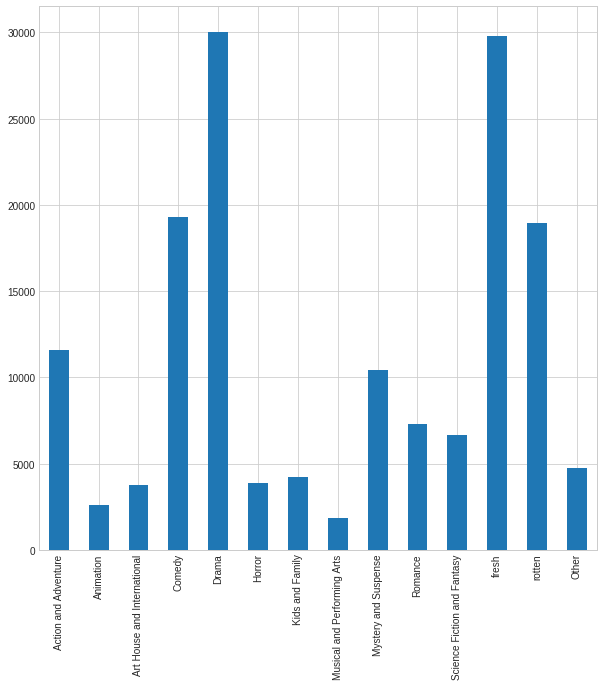

In [4]:
plt.figure(figsize=(10, 10))
data.iloc[:, 1:].sum(axis = 0, skipna = True).plot(kind='bar')

In [5]:
y_df = data.iloc[:, 1:]

In [6]:
tags = list(y_df.columns)
tags

['Action and Adventure',
 'Animation',
 'Art House and International',
 'Comedy',
 'Drama',
 'Horror',
 'Kids and Family',
 'Musical and Performing Arts',
 'Mystery and Suspense',
 'Romance',
 'Science Fiction and Fantasy',
 'fresh',
 'rotten',
 'Other']

In [7]:
y_df = data.iloc[:, 1:]
cols = list(y_df.columns[:-3]) + [y_df.columns[-1]] + list(y_df.columns[-3:-1])
# cols
y_df = y_df[cols]
y_df.columns
y_df_new = y_df.iloc[:,:-2]
y_df_new.columns

Index(['Action and Adventure', 'Animation', 'Art House and International',
       'Comedy', 'Drama', 'Horror', 'Kids and Family',
       'Musical and Performing Arts', 'Mystery and Suspense', 'Romance',
       'Science Fiction and Fantasy', 'Other'],
      dtype='object')

In [8]:
tags = list(y_df_new.columns)
tags

['Action and Adventure',
 'Animation',
 'Art House and International',
 'Comedy',
 'Drama',
 'Horror',
 'Kids and Family',
 'Musical and Performing Arts',
 'Mystery and Suspense',
 'Romance',
 'Science Fiction and Fantasy',
 'Other']

In [9]:
Y = y_df_new.values
Y[:5]

array([[0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0.]])

# Load Processed Data

In [10]:
import pickle

file_path = './data/rt-processed-20200821.pickle'
with open(file_path, 'rb') as pickle_file:
    text_train = pickle.load(pickle_file)
    y_train = pickle.load(pickle_file)
    text_test = pickle.load(pickle_file)
    y_test = pickle.load(pickle_file)
    comedydramafresh = pickle.load(pickle_file)
    dramafresh = pickle.load(pickle_file)
    comedyfresh = pickle.load(pickle_file)
    comedydramarotten = pickle.load(pickle_file)
    dramarotten = pickle.load(pickle_file)
    comedyrotten = pickle.load(pickle_file)

In [29]:
from sklearn.model_selection import train_test_split
y_train, y_test = train_test_split(Y, test_size=0.2, 
                                                    random_state=2020)
y_train.shape, y_test.shape

((39004, 12), (9751, 12))

# Modeling

With keras `embedding` layer

In [11]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input

/home/tao/anaconda3/envs/tf_gpu/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/tao/anaconda3/envs/tf_gpu/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/tao/anaconda3/envs/tf_gpu/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/tao/anaconda3/envs/tf_gpu/lib/python3.7/site-pack

In [12]:
# model setup
# EMBED_DIM = 150
# VOCAB_SIZE = 3000
# MAX_LENGTH = review_text.apply(len).max()

In [14]:
num_tags = y_df_new.shape[1]
num_tags

12

In [15]:
review_text = pd.concat([text_train,text_test])

In [16]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

tokenizer = Tokenizer()
tokenizer.fit_on_texts(review_text)

In [17]:
VOCAB_SIZE = len(tokenizer.word_index) + 1 #19793
EMBED_DIM = 100
MAX_LENGTH = review_text.apply(len).max()

In [18]:
X_train = tokenizer.texts_to_sequences(text_train)
X_test = tokenizer.texts_to_sequences(text_test)

X_train_pad = pad_sequences(X_train, maxlen=MAX_LENGTH, padding = 'post')
X_test_pad = pad_sequences(X_test, maxlen=MAX_LENGTH, padding = 'post')

X_train_pad.shape, X_test_pad.shape

((39004, 469), (9751, 469))

In [30]:
y_train.shape, y_test.shape

((39004, 12), (9751, 12))

In [19]:
cdf_test = tokenizer.texts_to_sequences(comedydramafresh)
cdr_test = tokenizer.texts_to_sequences(comedydramarotten)
cd = cdf_test + cdr_test
cd_test_pad = pad_sequences(cd, maxlen=MAX_LENGTH, padding = 'post')

In [20]:
df_test = tokenizer.texts_to_sequences(dramafresh)
dr_test = tokenizer.texts_to_sequences(dramarotten)
d_test = df_test + dr_test
d_test_pad = pad_sequences(d_test, maxlen=MAX_LENGTH, padding = 'post')


cf_test = tokenizer.texts_to_sequences(comedyfresh)
cr_test = tokenizer.texts_to_sequences(comedyrotten)
c_test = cf_test + cr_test
c_test_pad = pad_sequences(c_test, maxlen=MAX_LENGTH, padding = 'post')

In [21]:
cd_test_pad.shape, d_test_pad.shape, c_test_pad.shape

((779, 469), (955, 469), (830, 469))

In [22]:
import os
import numpy as np

GLOVE_DIR = '../spam_2019/data/'

embeddings_index = {}
f = open(os.path.join(GLOVE_DIR, 'glove.6B.100d.txt'))
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()

print('Found %s word vectors.' % len(embeddings_index))

Found 400000 word vectors.


In [23]:
embedding_matrix = np.zeros((VOCAB_SIZE, EMBED_DIM))
for word, i in tokenizer.word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # words not found in embedding index will be all-zeros.
        embedding_matrix[i] = embedding_vector

In [24]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, LSTM, GRU, Bidirectional,Flatten

In [25]:
model = Sequential()
model.add(Embedding(input_dim=VOCAB_SIZE, output_dim=EMBED_DIM, input_length=MAX_LENGTH, weights = [embedding_matrix]))
model.add(Flatten())
#model.add(Dense(256, activation='relu'))
#model.add(Dense(128, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(num_tags, activation='sigmoid'))
model.compile(loss = 'binary_crossentropy', optimizer='adam', metrics = ['accuracy'])
model.summary()

Instructions for updating:
Colocations handled automatically by placer.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 469, 100)          2304400   
_________________________________________________________________
flatten (Flatten)            (None, 46900)             0         
_________________________________________________________________
dense (Dense)                (None, 64)                3001664   
_________________________________________________________________
dense_1 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_2 (Dense)              (None, 12)                396       
Total params: 5,308,540
Trainable params: 5,308,540
Non-trainable params: 0
_________________________________________________________________


In [31]:
model.fit(X_train_pad, y_train, epochs = 10, batch_size=32, validation_split=0.1)
print('Eval loss/accuracy:{}'.format(model.evaluate(X_test_pad, y_test, batch_size = 32)))

Train on 35103 samples, validate on 3901 samples
Instructions for updating:
Use tf.cast instead.
Epoch 1/10
35103/35103 [==============================] - 8s 231us/sample - loss: 0.1576 - acc: 0.9415 - val_loss: 0.0491 - val_acc: 0.9853
Epoch 2/10
35103/35103 [==============================] - 8s 221us/sample - loss: 0.0220 - acc: 0.9936 - val_loss: 0.0221 - val_acc: 0.9934
Epoch 3/10
35103/35103 [==============================] - 8s 218us/sample - loss: 0.0053 - acc: 0.9986 - val_loss: 0.0216 - val_acc: 0.9939
Epoch 4/10
35103/35103 [==============================] - 8s 218us/sample - loss: 0.0027 - acc: 0.9993 - val_loss: 0.0207 - val_acc: 0.9944
Epoch 5/10
35103/35103 [==============================] - 7s 213us/sample - loss: 0.0032 - acc: 0.9990 - val_loss: 0.0282 - val_acc: 0.9938
Epoch 6/10
35103/35103 [==============================] - 8s 216us/sample - loss: 0.0033 - acc: 0.9989 - val_loss: 0.0248 - val_acc: 0.9945
Epoch 7/10
35103/35103 [==============================] - 8s 21

In [32]:
selected_idx = np.sort(np.random.choice(comedydramafresh.index.values, 50))
selected_idx

array([ 2156,  2222,  4248,  4263,  7097,  7110,  7151, 10994, 11709,
       11806, 12560, 16876, 16890, 16896, 16927, 17043, 17630, 20201,
       20247, 20844, 21053, 25889, 30779, 32505, 32525, 32546, 32546,
       32597, 38489, 40975, 40981, 41004, 41033, 41061, 41066, 41617,
       41679, 42955, 43334, 43334, 44389, 44427, 44432, 44452, 44457,
       47844, 47857, 47864, 47875, 48377])

In [35]:
np.random.seed(2020)
#selected_exp = np.random.choice(exp_test_pad, 50)
# exp_test_pad.shape[0] # 557
selected_idx = np.random.choice(cd_test_pad.shape[0], 50, replace=False)
selected_exp = cd_test_pad[selected_idx,:]
selected_exp.shape

(50, 469)

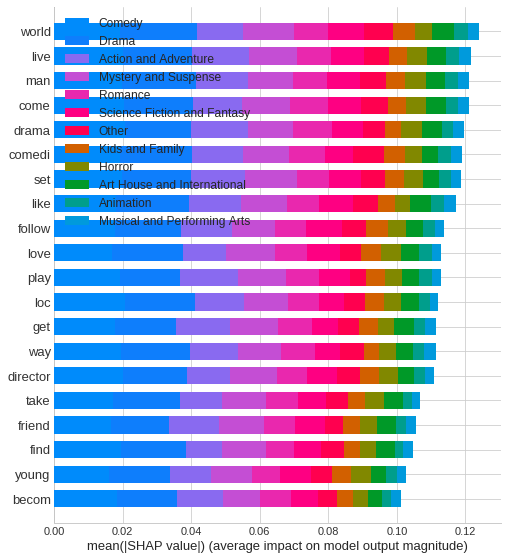

In [38]:
import shap

attrib_data = X_train_pad[:10000]
explainer = shap.DeepExplainer(model, attrib_data)
num_explanations = 1000
shap_vals = explainer.shap_values(X_test_pad[:num_explanations])
num2word = {}
for w in tokenizer.word_index.keys():
    num2word[tokenizer.word_index[w]] = w
x_test_words = np.stack([np.array(list(map(lambda x: num2word.get(x, "NONE"), X_test_pad[i]))) for i in range(1000)])
shap.summary_plot(shap_vals, class_names=y_df.columns, feature_names=list(num2word.values()))

In [39]:
shap_vals[0].shape

(1000, 469)

Action and Adventure


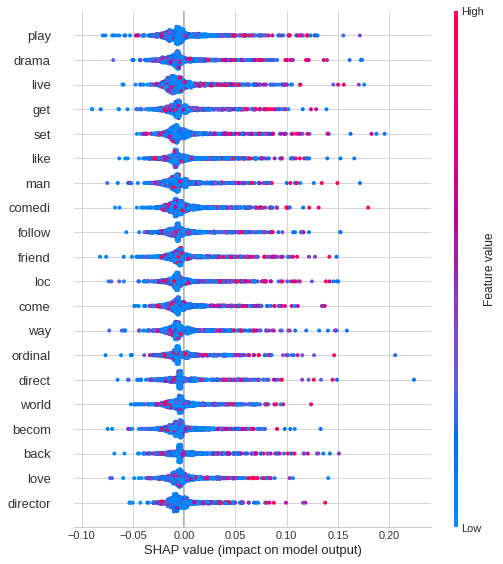

Animation


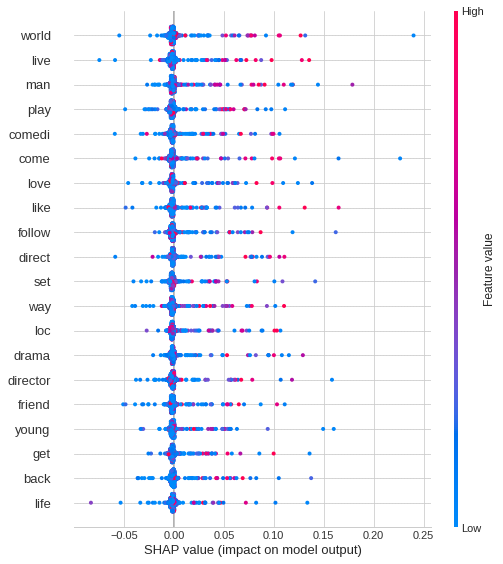

Art House and International


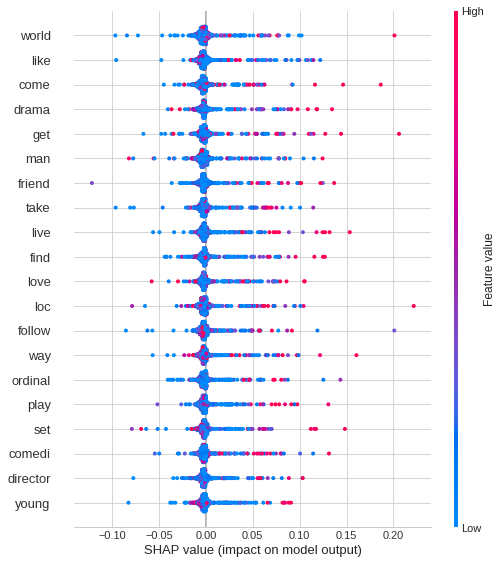

Comedy


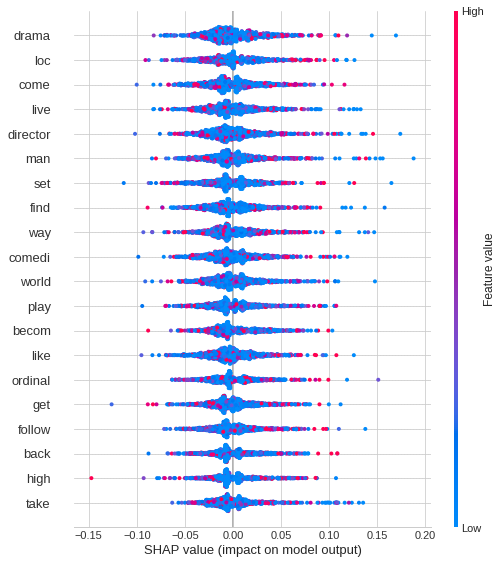

Drama


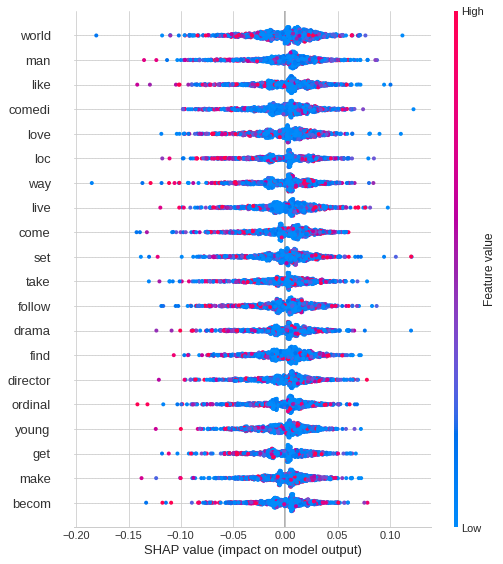

Horror


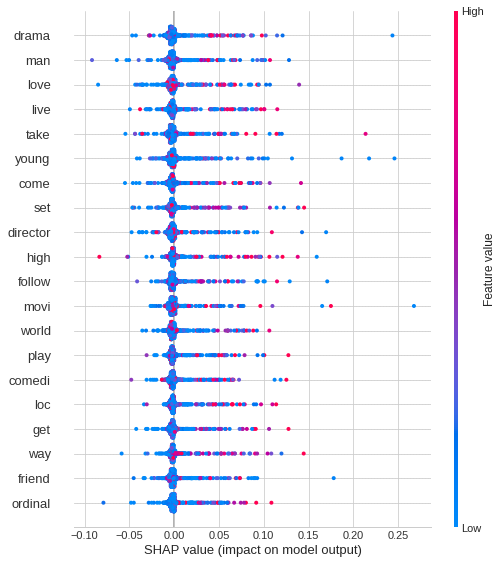

Kids and Family


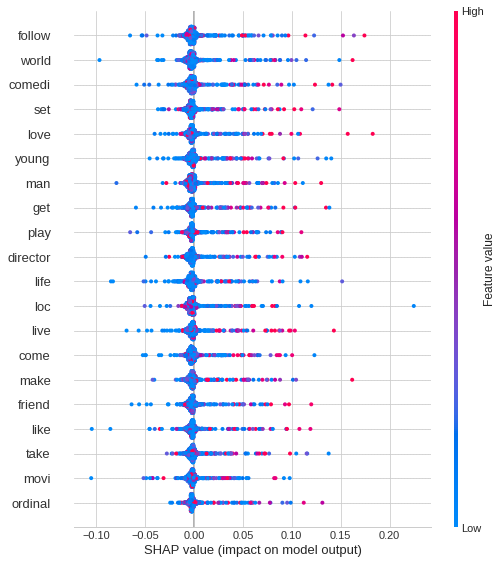

Musical and Performing Arts


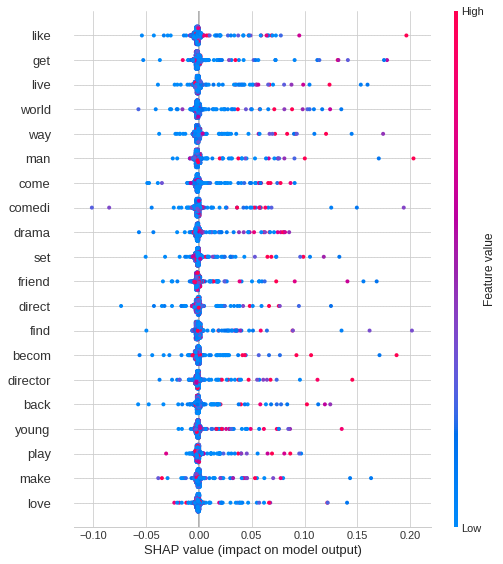

Mystery and Suspense


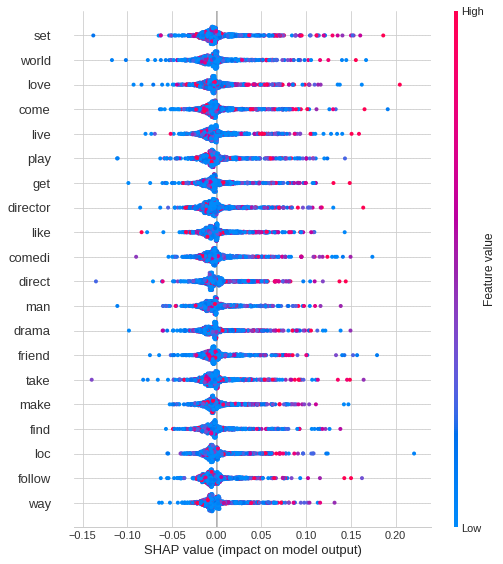

Romance


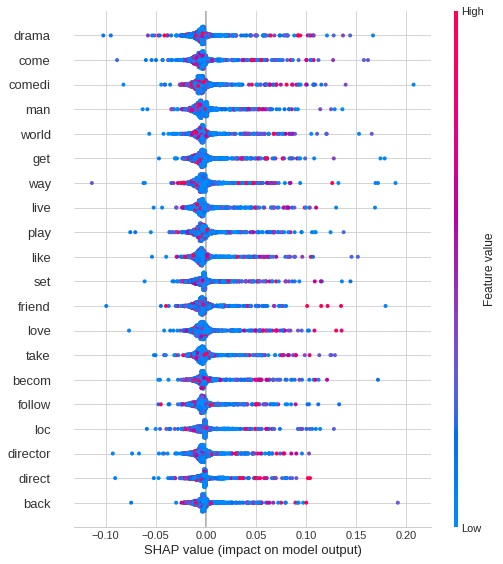

Science Fiction and Fantasy


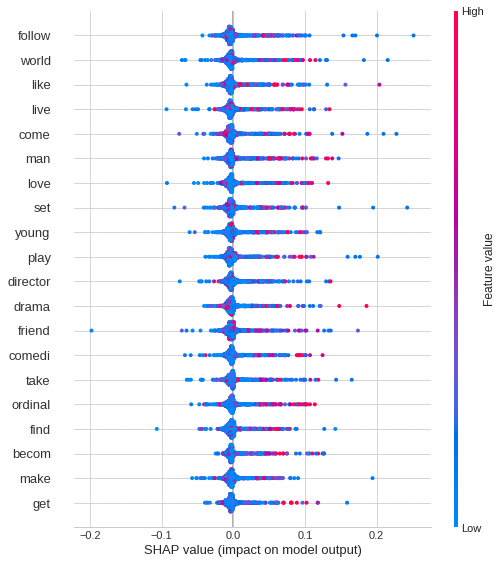

Other


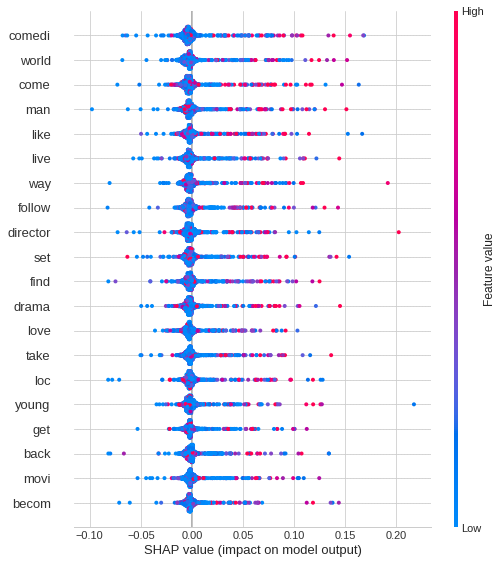

In [41]:
for i in range(12):
    print(y_df.columns[i])
    shap.summary_plot(shap_vals[i], X_test_pad[:num_explanations], feature_names=list(num2word.values()))

In [42]:
cd_test_pad.shape

(779, 469)

In [50]:
cd_test_pad[0]

array([ 351,   33,    2,    2,  874,  699, 1588, 2252,  836,  882, 1327,
        210,  208, 2218, 2287, 2302,  657, 1644,  856,  550,  247,  158,
        101,  879,  265,  166,   23,  831,  550, 2009,    2, 1521,    1,
        384,   13,   64,   74,  637,  442,  919, 1868, 1430,  961,  175,
          1,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,   

In [48]:
for c in cd:
    print(c)
    break

[351, 33, 2, 2, 874, 699, 1588, 2252, 836, 882, 1327, 210, 208, 2218, 2287, 2302, 657, 1644, 856, 550, 247, 158, 101, 879, 265, 166, 23, 831, 550, 2009, 2, 1521, 1, 384, 13, 64, 74, 637, 442, 919, 1868, 1430, 961, 175, 1]


In [51]:
x_test_words = np.stack([np.array(list(map(lambda x: num2word.get(x, "NONE"), 
                                           c))) for c in cd_test_pad])

In [44]:
attrib_data = X_train_pad[:10000]
explainer = shap.DeepExplainer(model, attrib_data)
#num_explanations = 50
shap_vals_cdf = explainer.shap_values(cd_test_pad)
num2word = {}
for w in tokenizer.word_index.keys():
    num2word[tokenizer.word_index[w]] = w


TypeError: 'int' object is not iterable

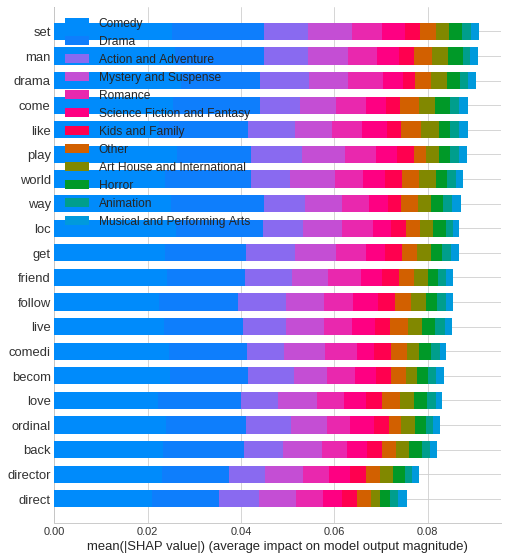

In [52]:
x_test_words = np.stack([np.array(list(map(lambda x: num2word.get(x, "NONE"), 
                                           c))) for c in cd_test_pad])
shap.summary_plot(shap_vals_cdf, class_names=y_df.columns, feature_names=list(num2word.values()))

Action and Adventure


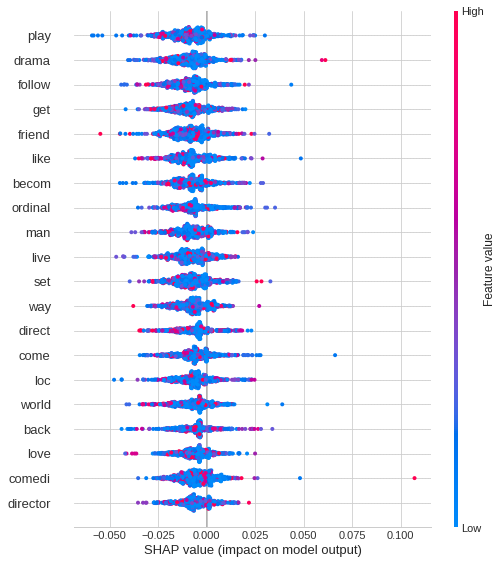

Animation


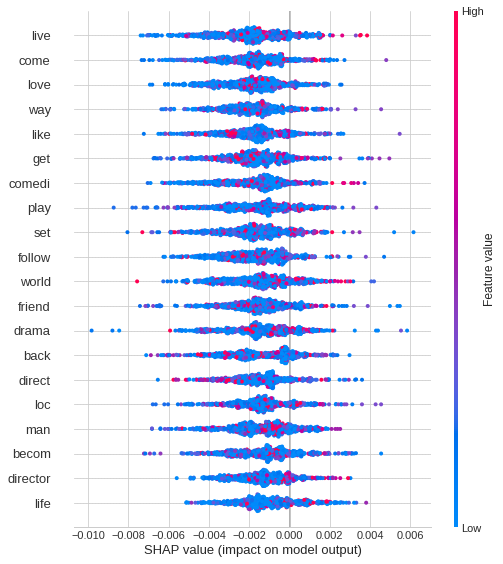

Art House and International


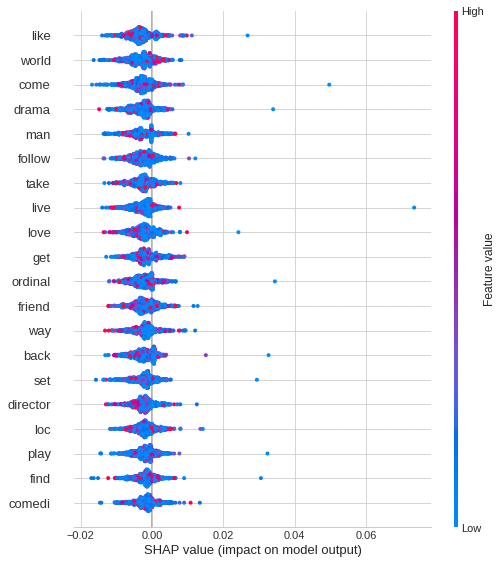

Comedy


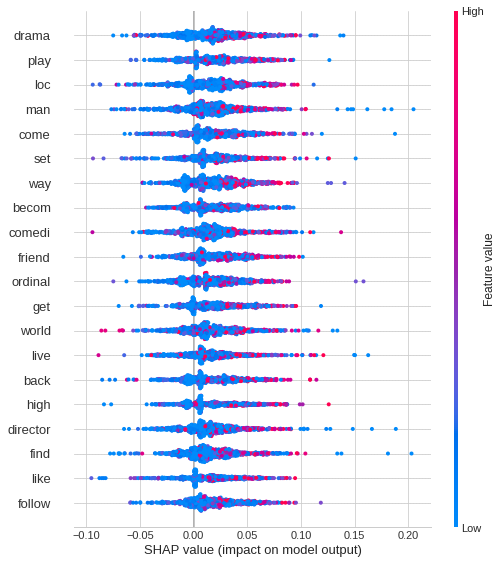

Drama


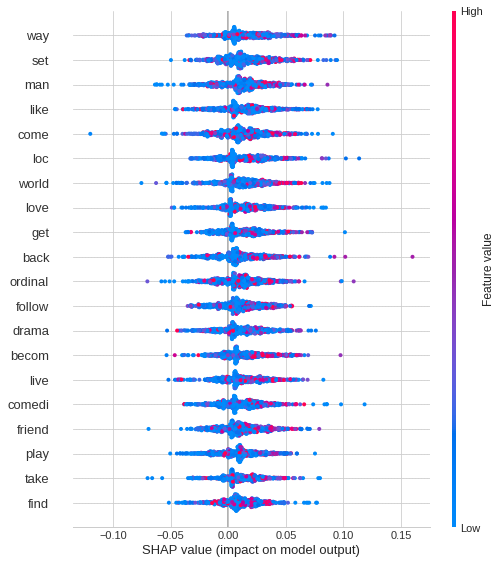

Horror


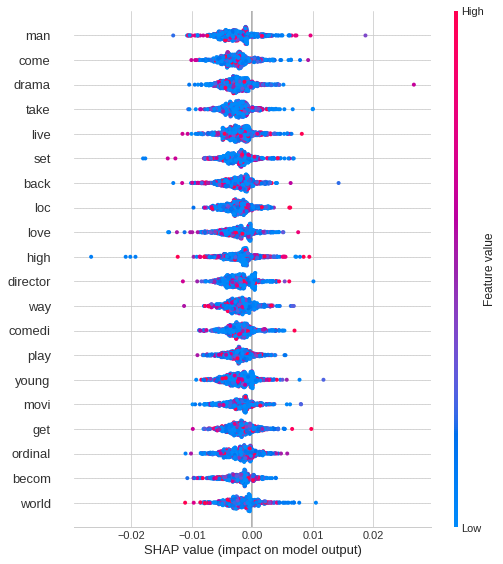

Kids and Family


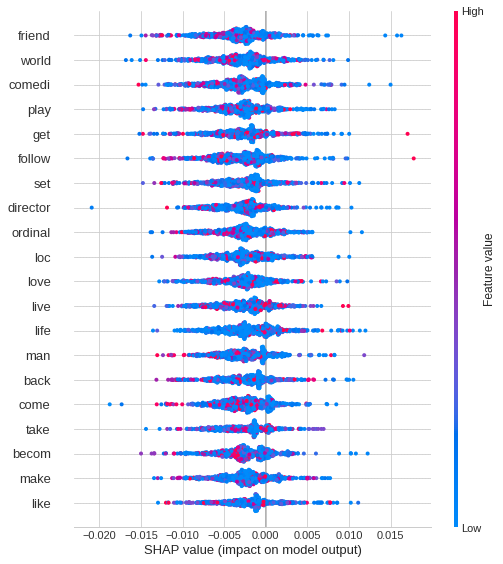

Musical and Performing Arts


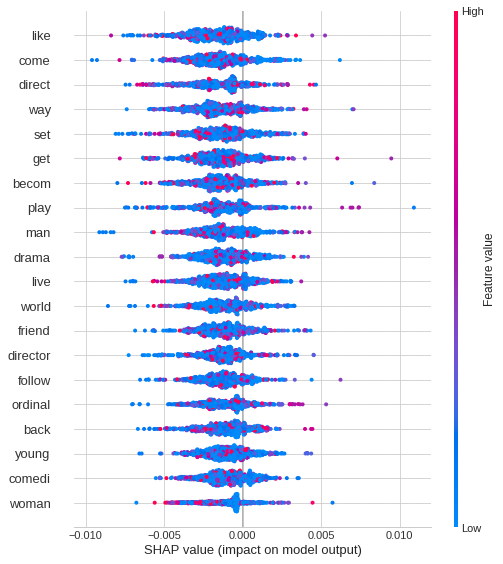

Mystery and Suspense


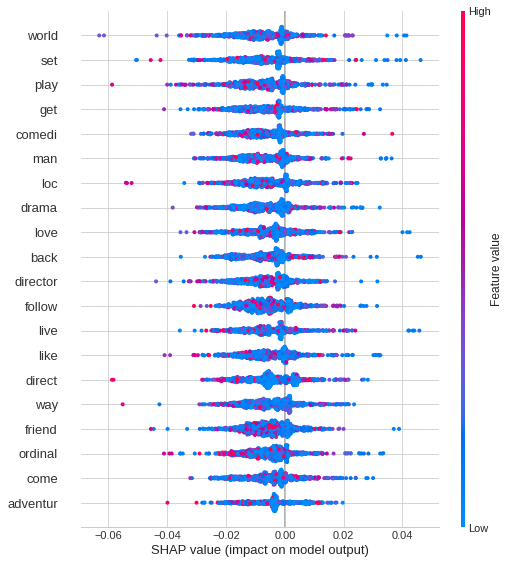

Romance


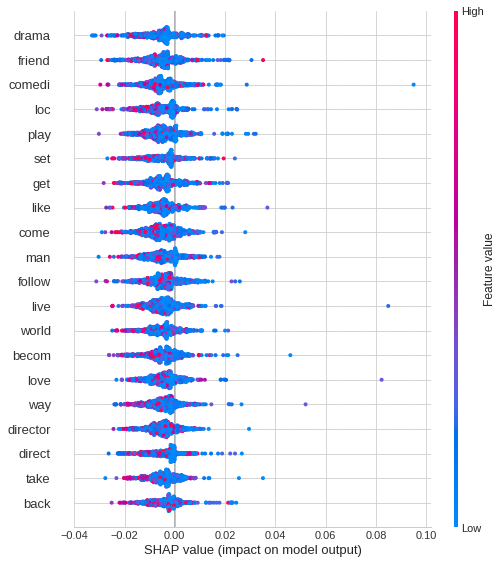

Science Fiction and Fantasy


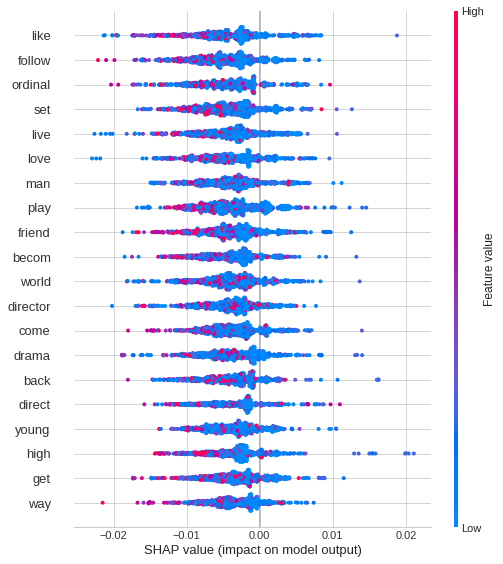

Other


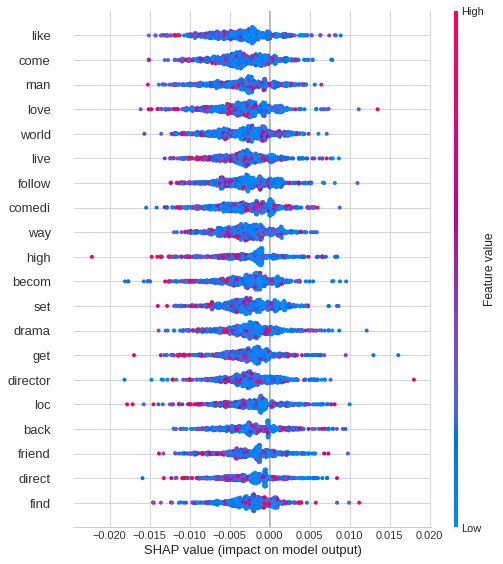

In [53]:
for i in range(12):
    print(y_df.columns[i])
    shap.summary_plot(shap_vals_cdf[i], cd_test_pad, feature_names=list(num2word.values()))

In [54]:
np.random.seed(2020)
#selected_exp = np.random.choice(exp_test_pad, 50)
# exp_test_pad.shape[0] # 557
selected_idx = np.random.choice(d_test_pad.shape[0], 500, replace=False)
selected_exp = d_test_pad[selected_idx,:]
selected_exp.shape

(500, 469)

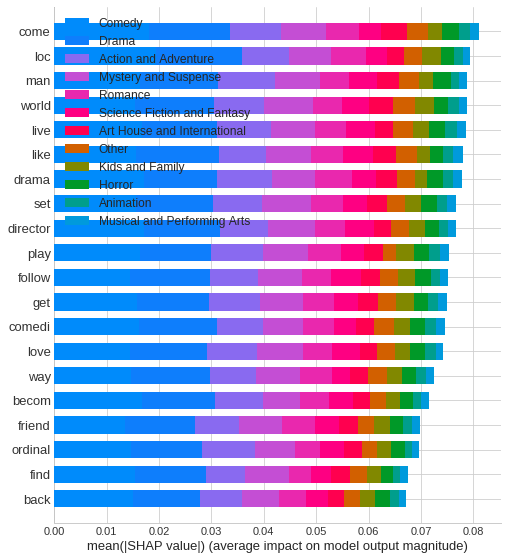

In [55]:
attrib_data = X_train_pad[:3000]
explainer = shap.DeepExplainer(model, attrib_data)
#num_explanations = 50
shap_vals_cdf = explainer.shap_values(selected_exp)
num2word = {}
for w in tokenizer.word_index.keys():
    num2word[tokenizer.word_index[w]] = w
x_test_words = np.stack([np.array(list(map(lambda x: num2word.get(x, "NONE"), selected_exp[i]))) for i in range(500)])
shap.summary_plot(shap_vals_cdf, class_names=y_df.columns, feature_names=list(num2word.values()))

Action and Adventure


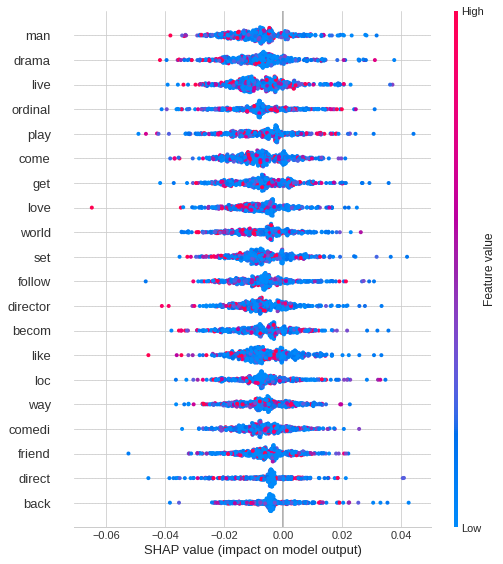

Animation


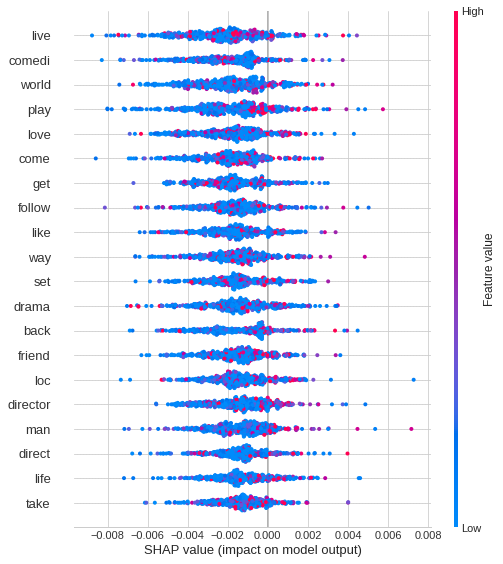

Art House and International


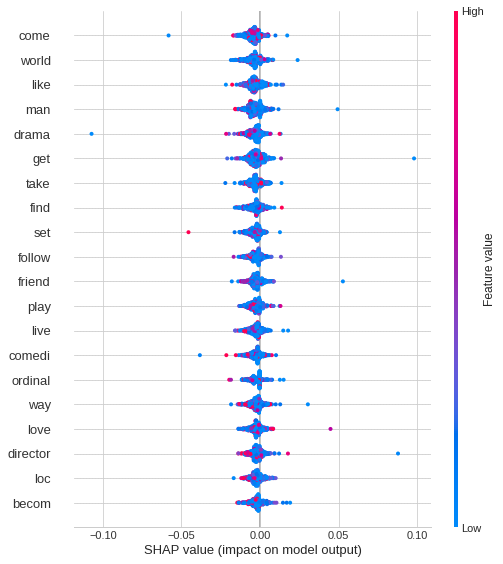

Comedy


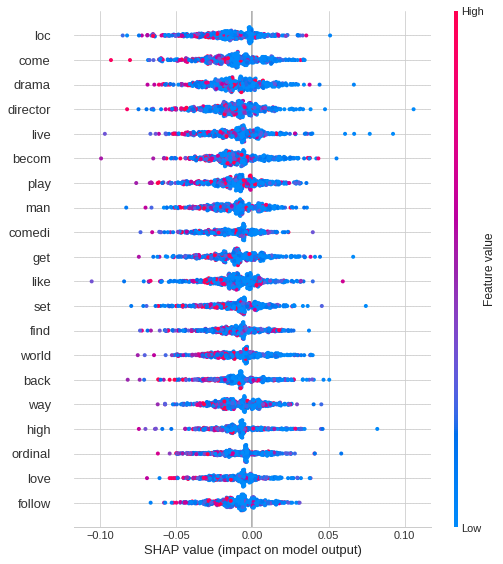

Drama


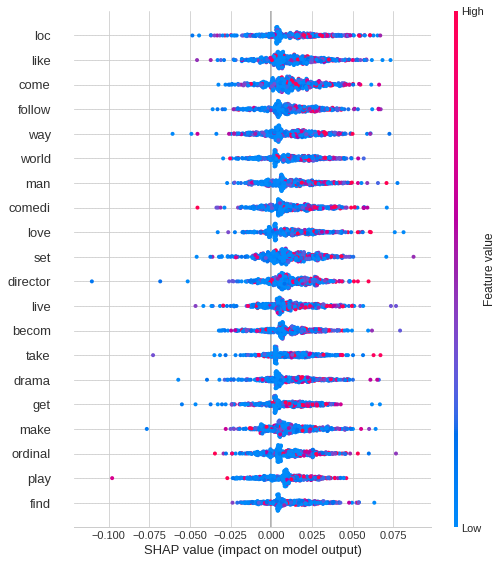

Horror


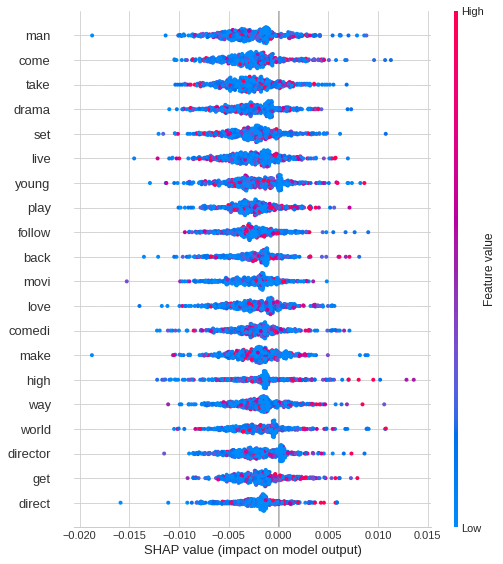

Kids and Family


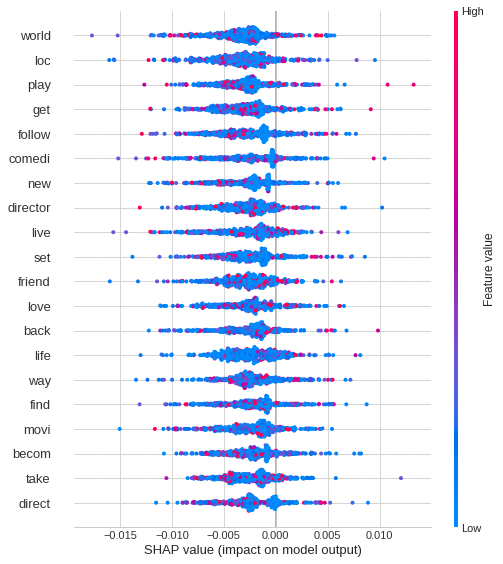

Musical and Performing Arts


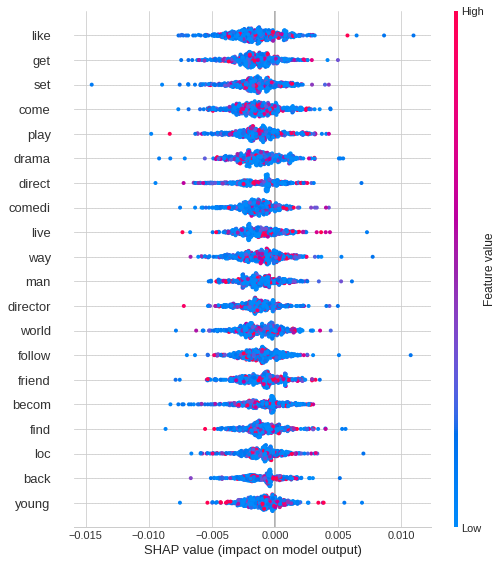

Mystery and Suspense


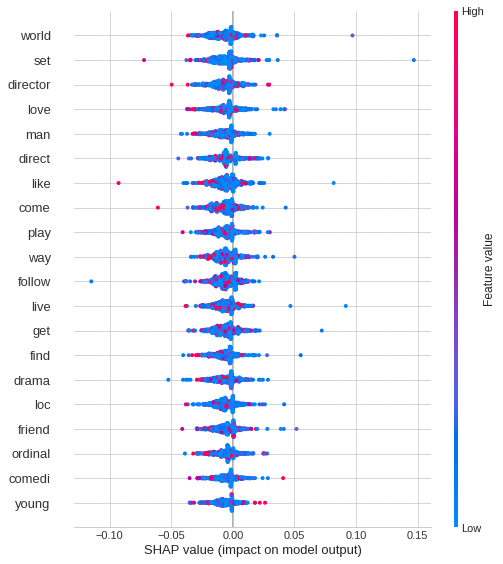

Romance


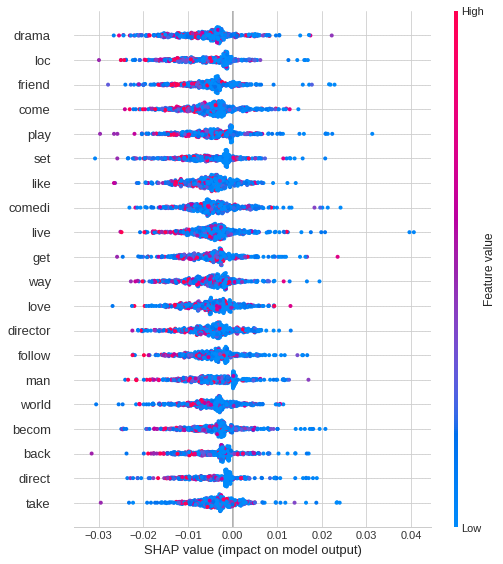

Science Fiction and Fantasy


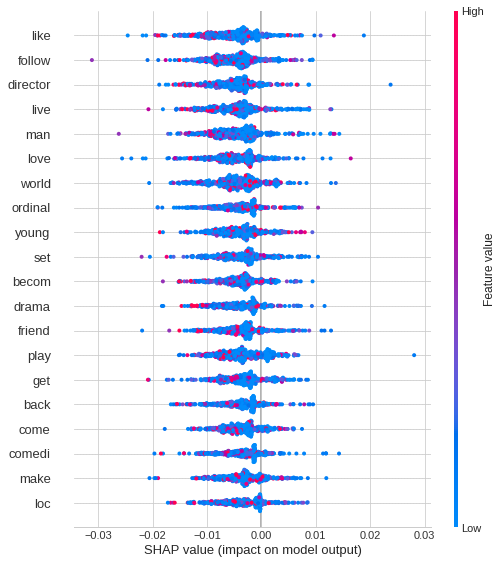

Other


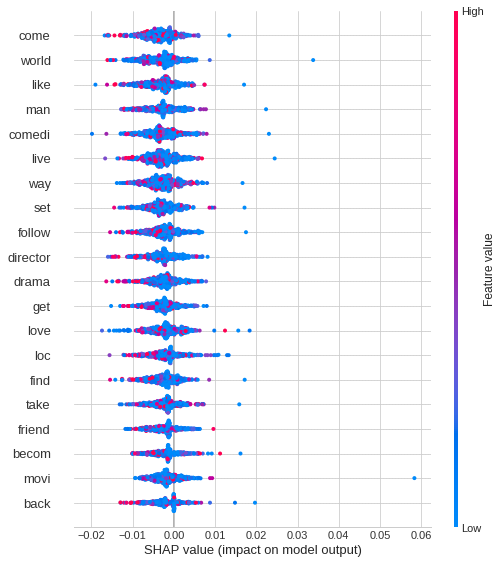

In [56]:
for i in range(12):
    print(y_df.columns[i])
    shap.summary_plot(shap_vals_cdf[i], selected_exp, feature_names=list(num2word.values()))

In [66]:
selected_idx = np.sort(np.random.choice(dramafresh.index.values, 50))
# selected_idx

np.random.seed(2020)
#selected_exp = np.random.choice(exp_test_pad, 50)
# exp_test_pad.shape[0] # 557
selected_idx = np.random.choice(df_test_pad.shape[0], 50, replace=False)
selected_exp = df_test_pad[selected_idx,:]
selected_exp.shape

(50, 579)

In [69]:
selected_idx = np.sort(np.random.choice(comedyfresh.index.values, 50))
# selected_idx

np.random.seed(2020)
#selected_exp = np.random.choice(exp_test_pad, 50)
# exp_test_pad.shape[0] # 557
selected_idx = np.random.choice(cf_test_pad.shape[0], 50, replace=False)
selected_exp = cf_test_pad[selected_idx,:]
selected_exp.shape

(50, 579)

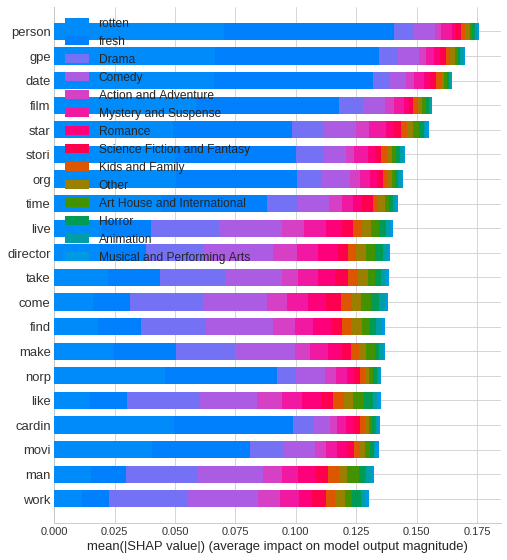

In [70]:
attrib_data = X_train_pad[:3000]
explainer = shap.DeepExplainer(model, attrib_data)
#num_explanations = 50
shap_vals_cdf = explainer.shap_values(selected_exp)
num2word = {}
for w in tokenizer.word_index.keys():
    num2word[tokenizer.word_index[w]] = w
x_test_words = np.stack([np.array(list(map(lambda x: num2word.get(x, "NONE"), selected_exp[i]))) for i in range(50)])
shap.summary_plot(shap_vals_cdf, class_names=y_df.columns, feature_names=list(num2word.values()))

Action and Adventure


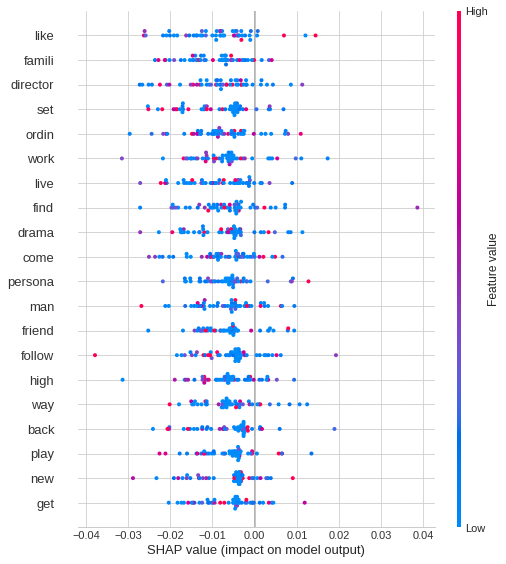

Animation


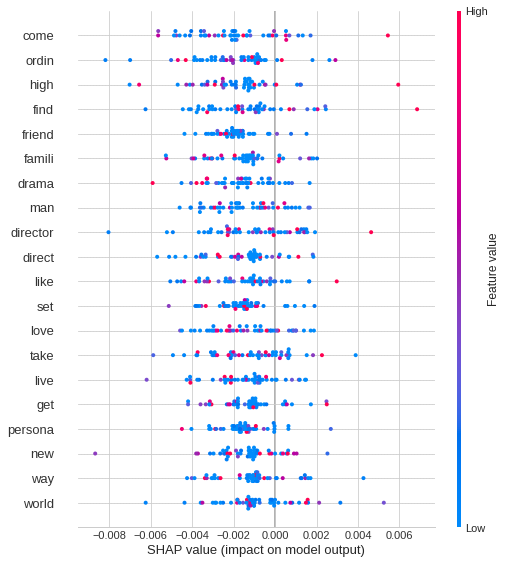

Art House and International


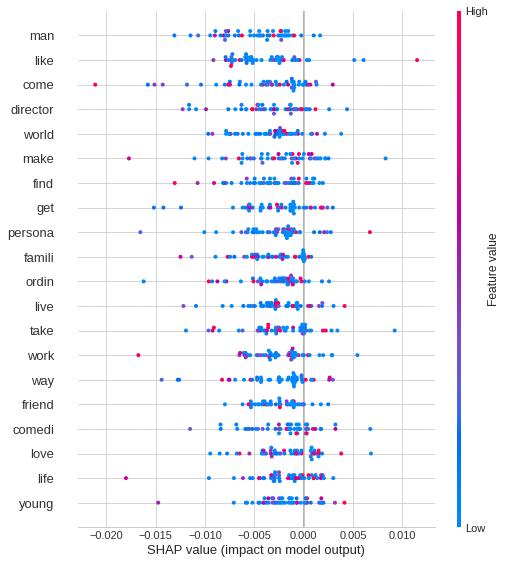

Comedy


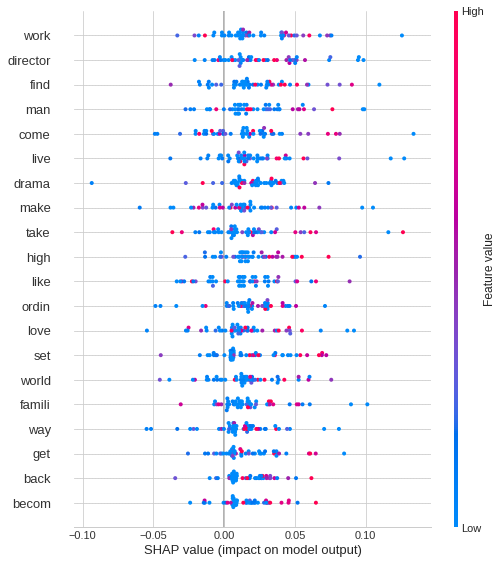

Drama


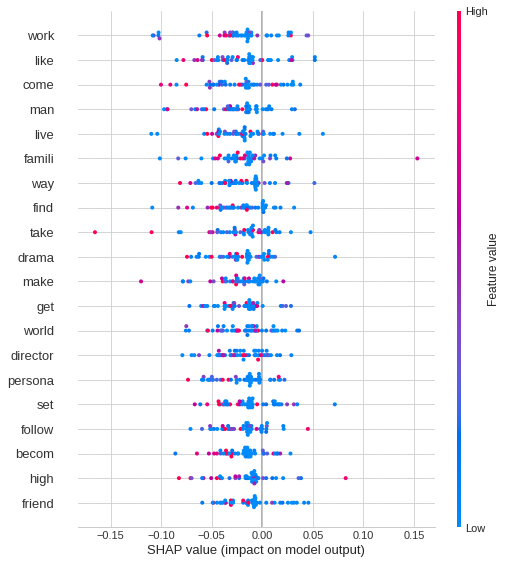

Horror


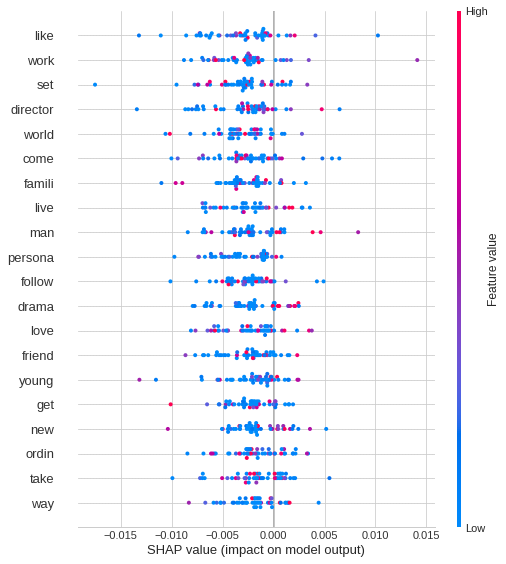

Kids and Family


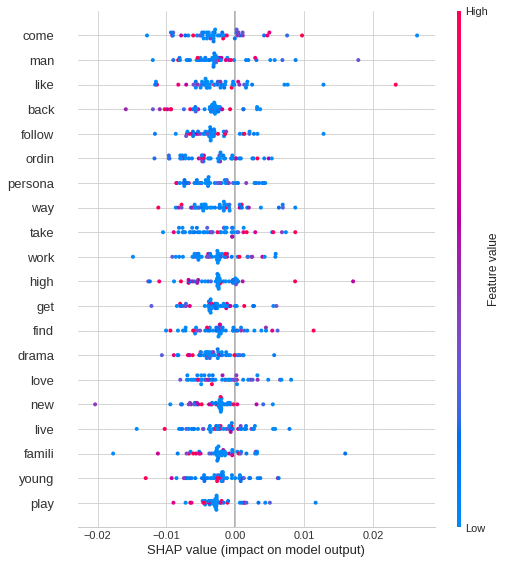

Musical and Performing Arts


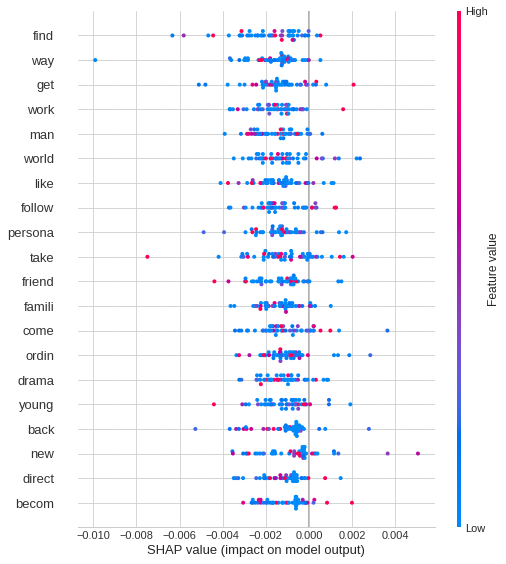

Mystery and Suspense


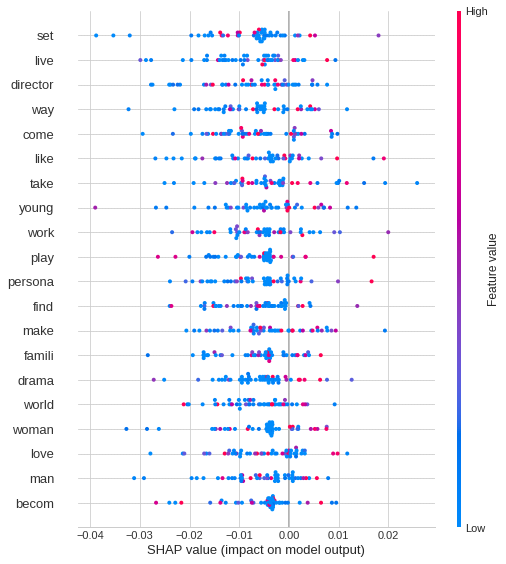

Romance


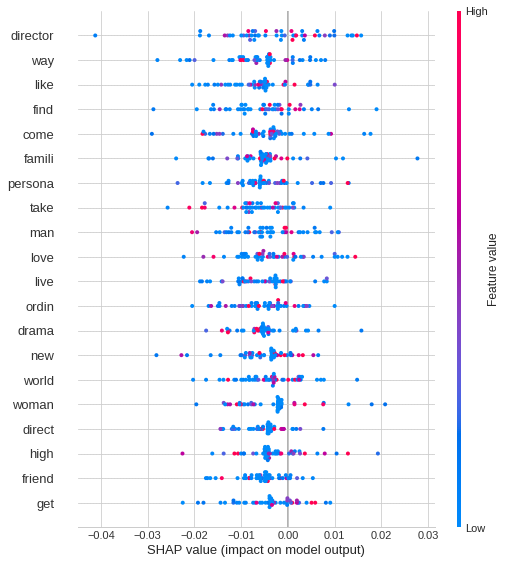

Science Fiction and Fantasy


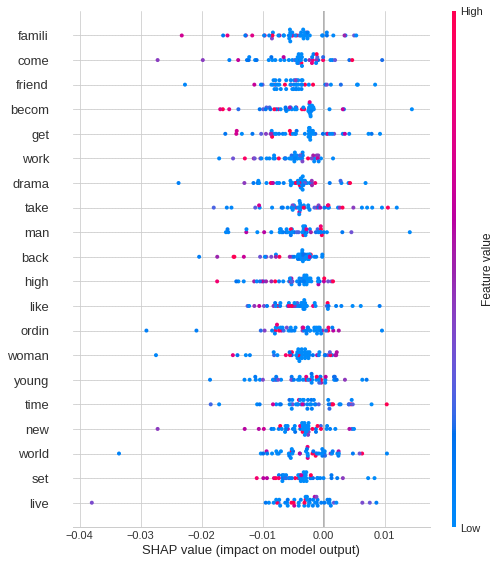

fresh


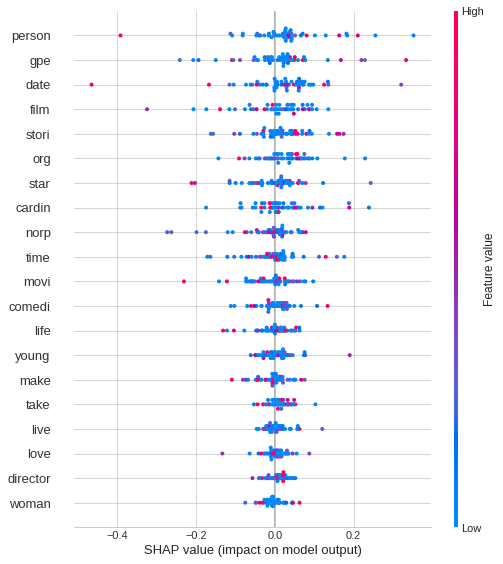

rotten


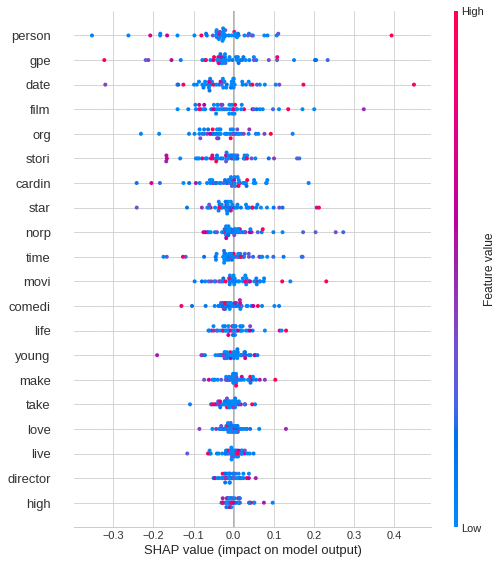

Other


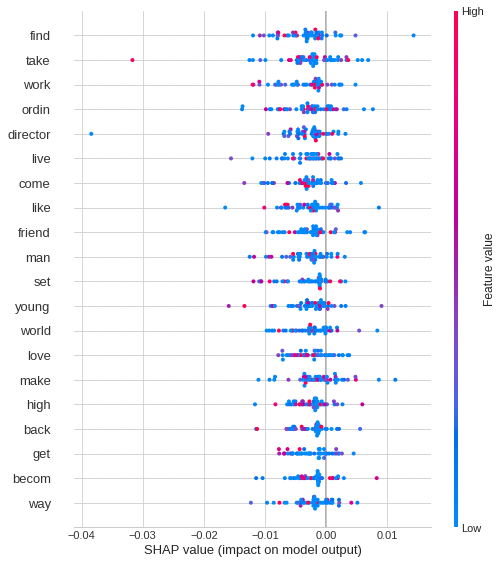

In [71]:
for i in range(14):
    print(y_df.columns[i])
    shap.summary_plot(shap_vals_cdf[i], selected_exp, feature_names=list(num2word.values()))

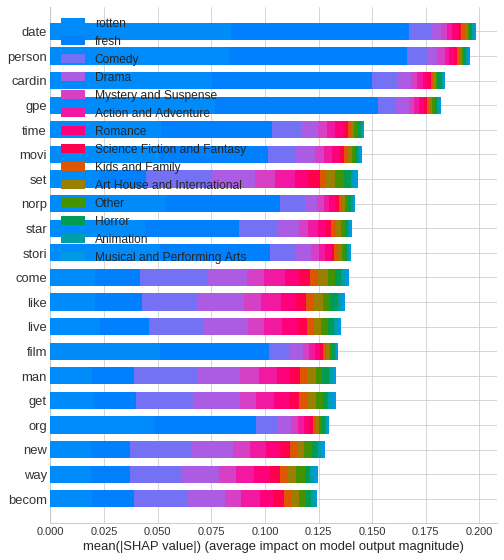

In [83]:
attrib_data = X_train_pad[:3000]
explainer = shap.DeepExplainer(model, attrib_data)
#num_explanations = 50
shap_vals_cdf = explainer.shap_values(cdr_test_pad)
num2word = {}
for w in tokenizer.word_index.keys():
    num2word[tokenizer.word_index[w]] = w
x_test_words = np.stack([np.array(list(map(lambda x: num2word.get(x, "NONE"), cdr_test_pad[i]))) for i in range(100)])
shap.summary_plot(shap_vals_cdf, class_names=y_df.columns, feature_names=list(num2word.values()))

Action and Adventure


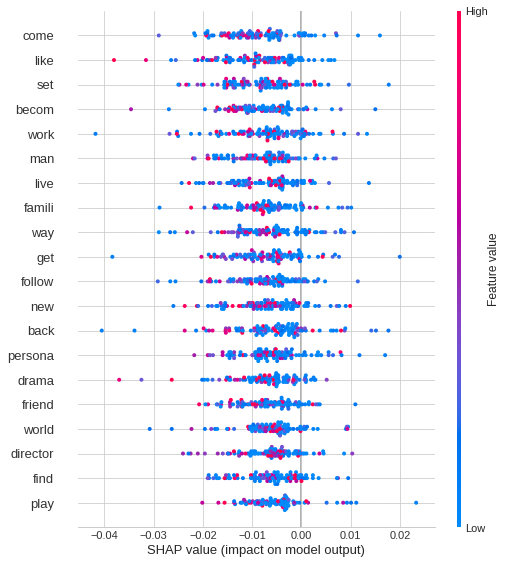

Animation


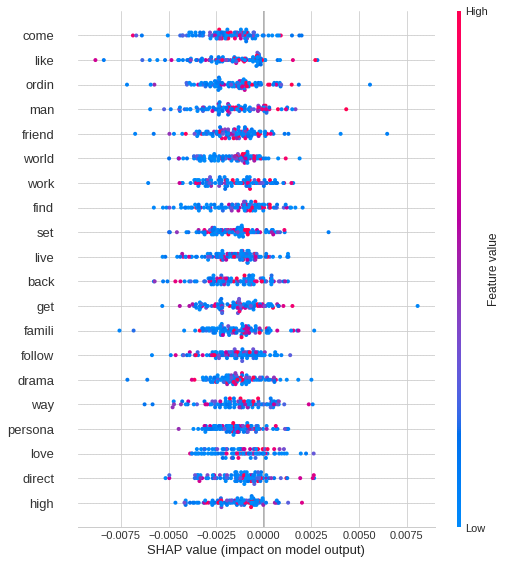

Art House and International


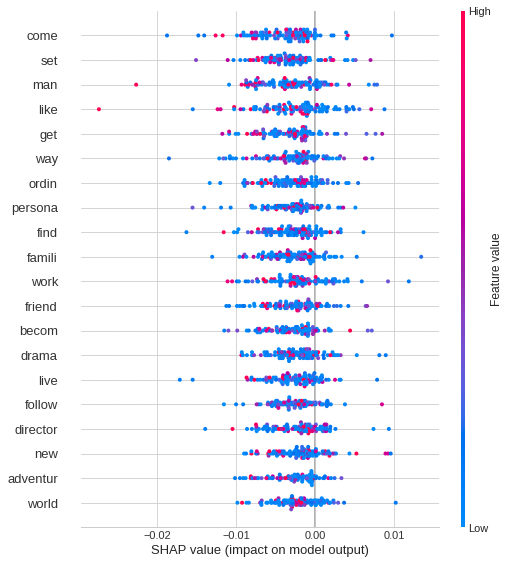

Comedy


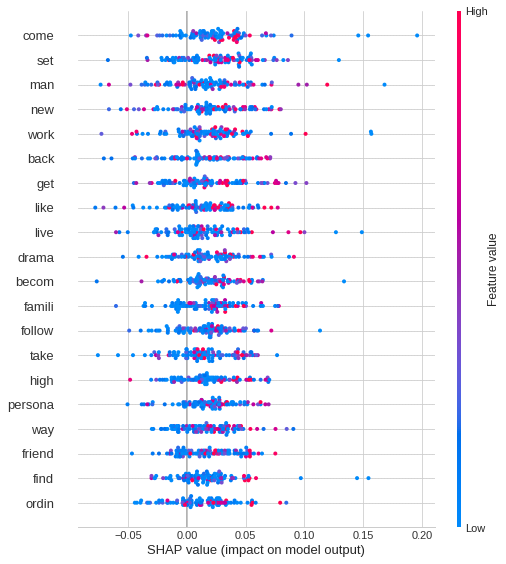

Drama


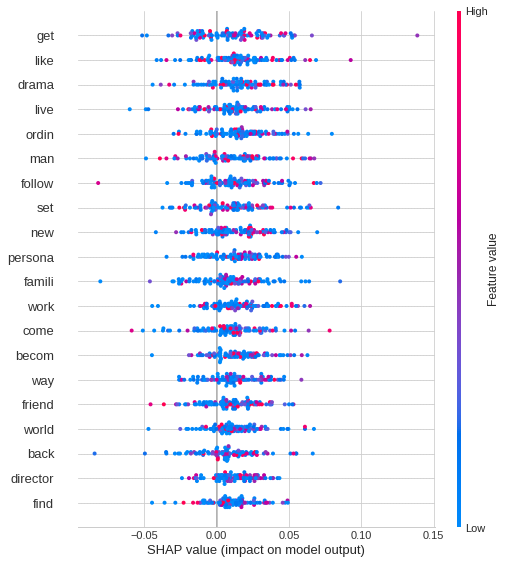

Horror


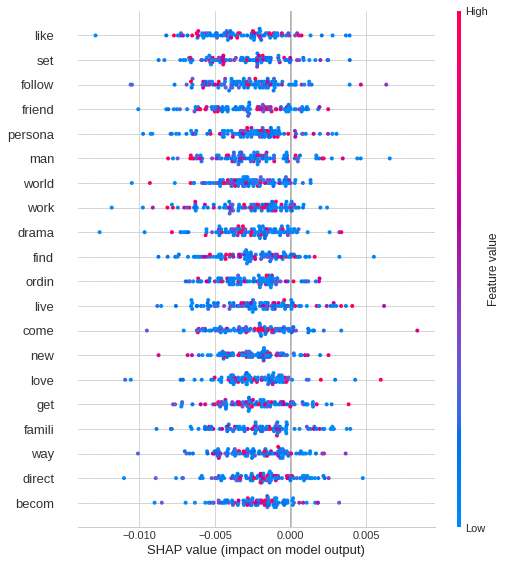

Kids and Family


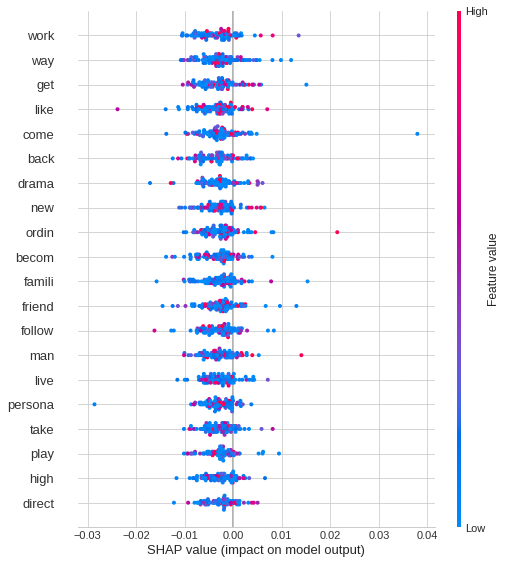

Musical and Performing Arts


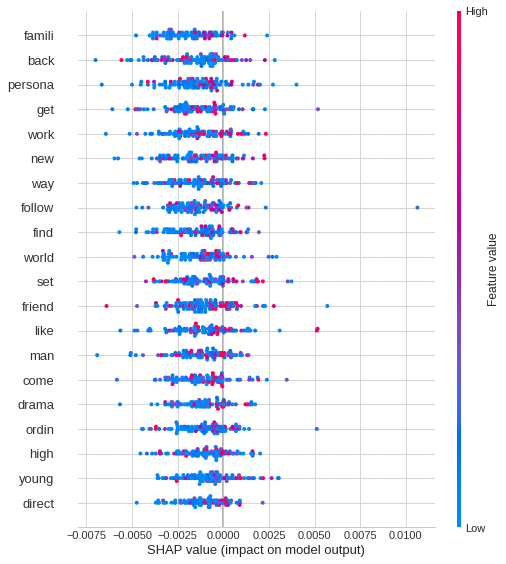

Mystery and Suspense


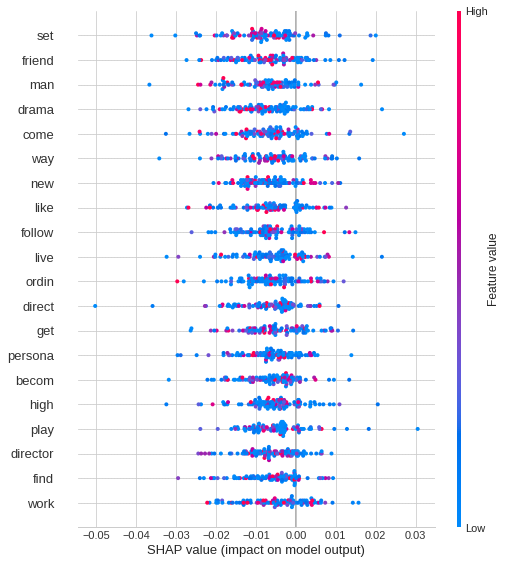

Romance


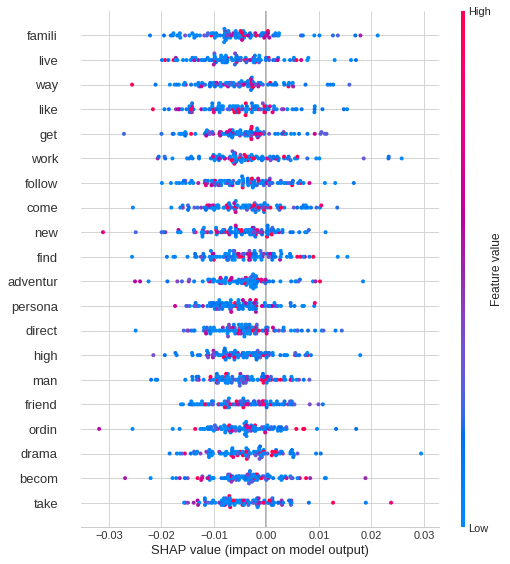

Science Fiction and Fantasy


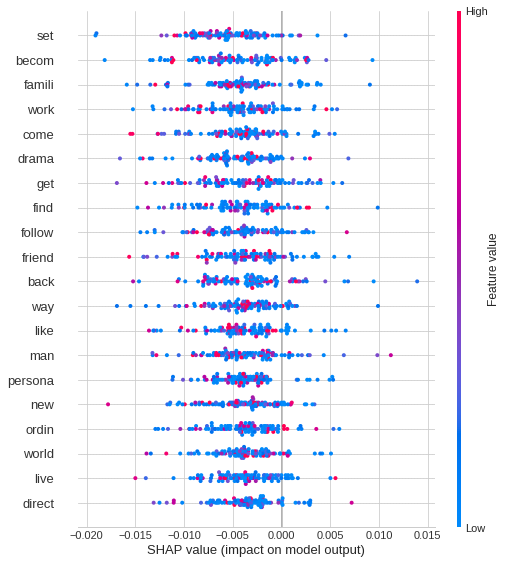

fresh


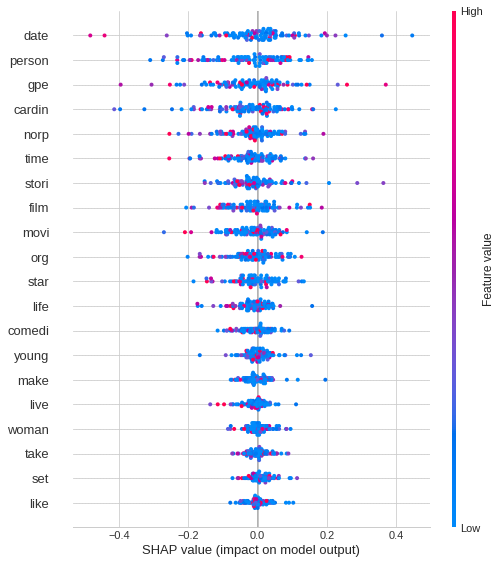

rotten


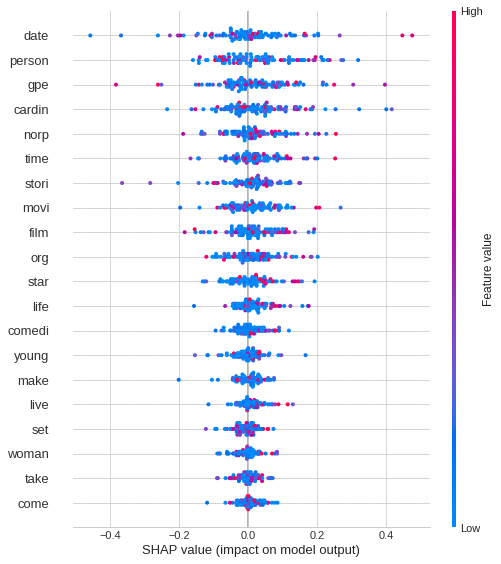

Other


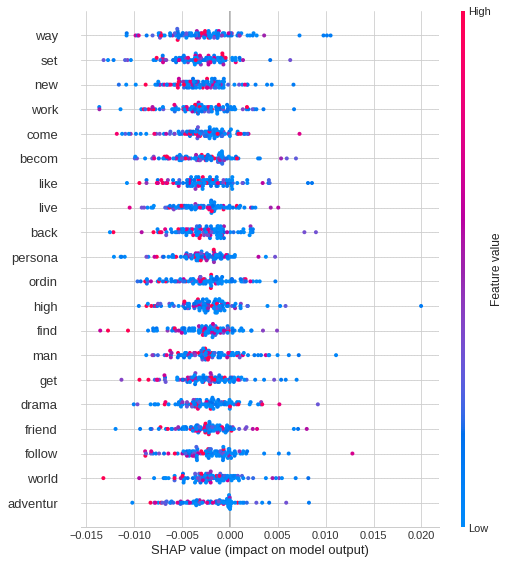

In [84]:
for i in range(14):
    print(y_df.columns[i])
    shap.summary_plot(shap_vals_cdf[i], cdr_test_pad, feature_names=list(num2word.values()))

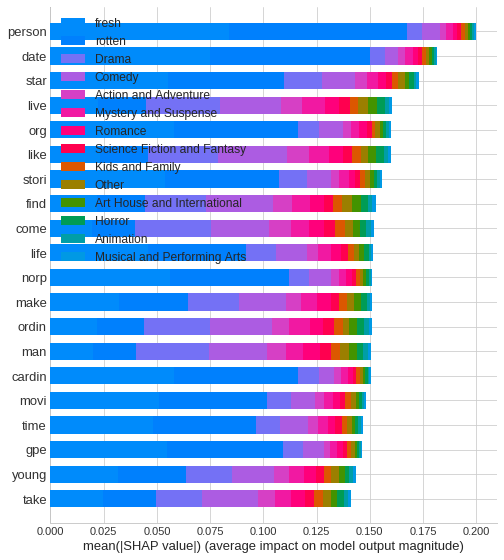

In [85]:
attrib_data = X_train_pad[:3000]
explainer = shap.DeepExplainer(model, attrib_data)
#num_explanations = 50
shap_vals_cdf = explainer.shap_values(cr_test_pad)
num2word = {}
for w in tokenizer.word_index.keys():
    num2word[tokenizer.word_index[w]] = w
x_test_words = np.stack([np.array(list(map(lambda x: num2word.get(x, "NONE"), cr_test_pad[i]))) for i in range(100)])
shap.summary_plot(shap_vals_cdf, class_names=y_df.columns, feature_names=list(num2word.values()))

Action and Adventure


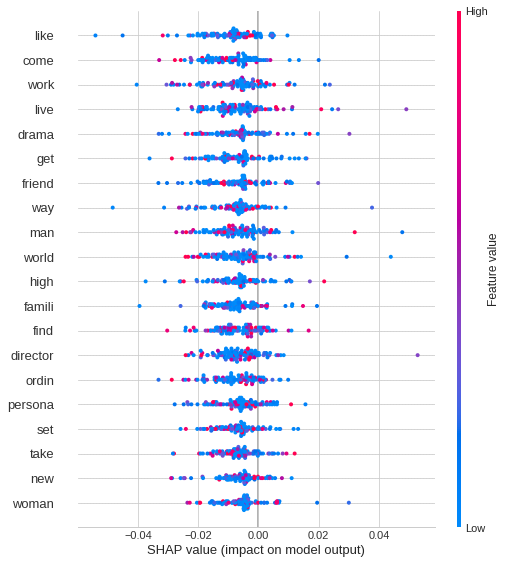

Animation


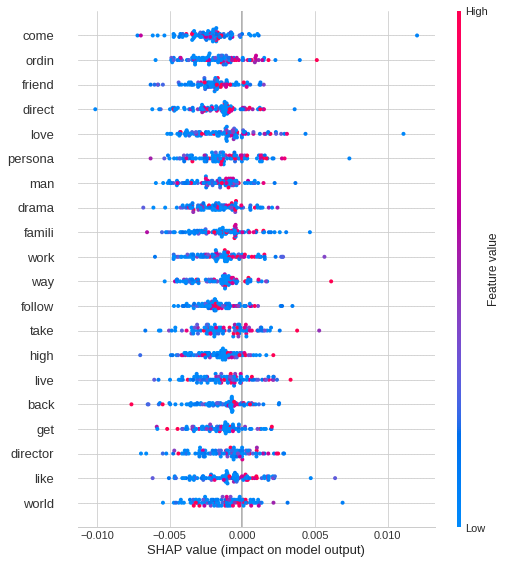

Art House and International


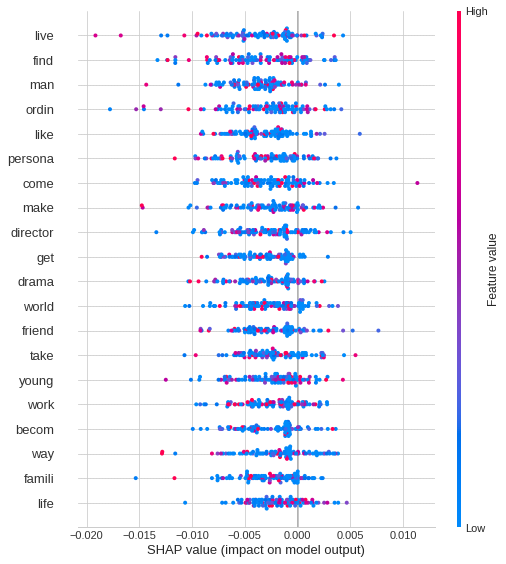

Comedy


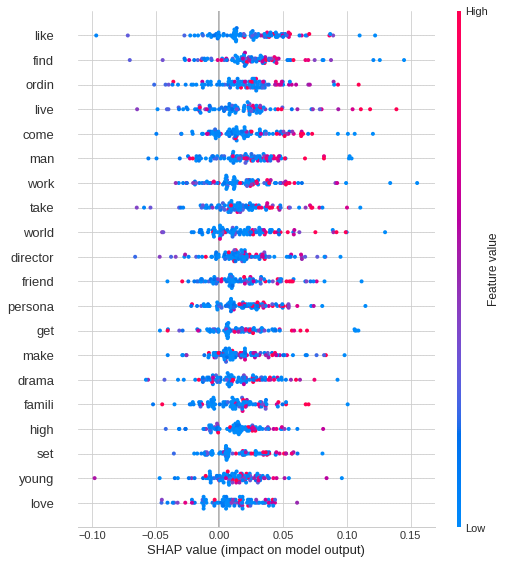

Drama


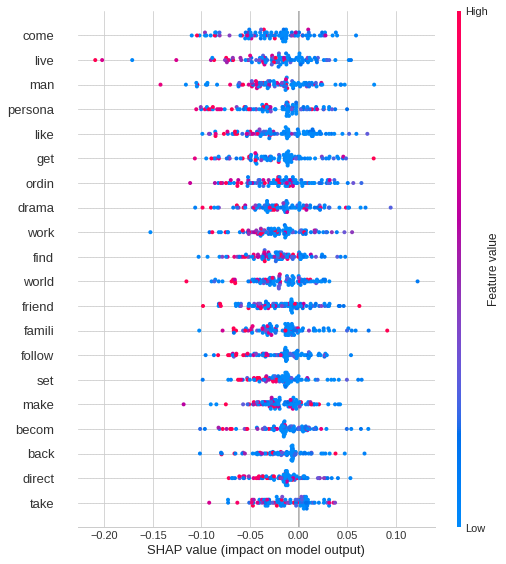

Horror


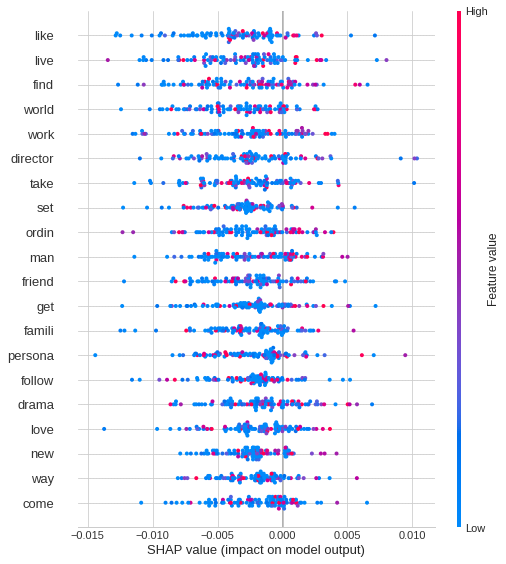

Kids and Family


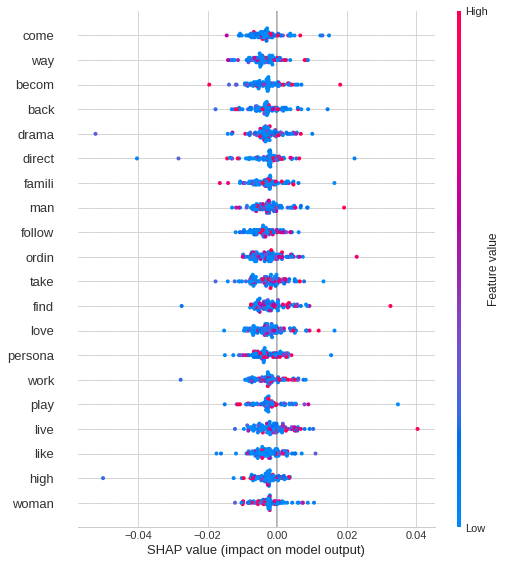

Musical and Performing Arts


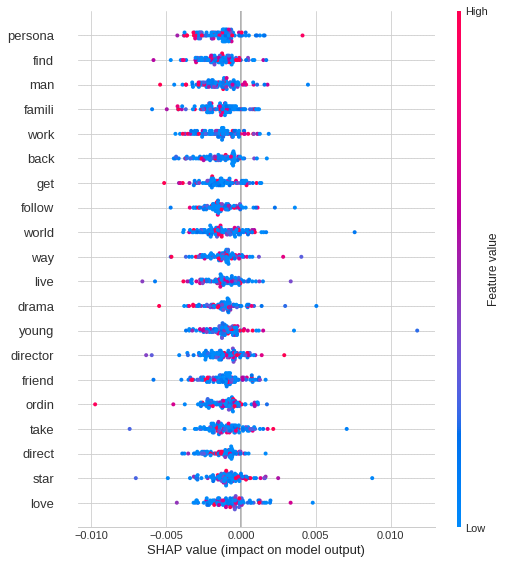

Mystery and Suspense


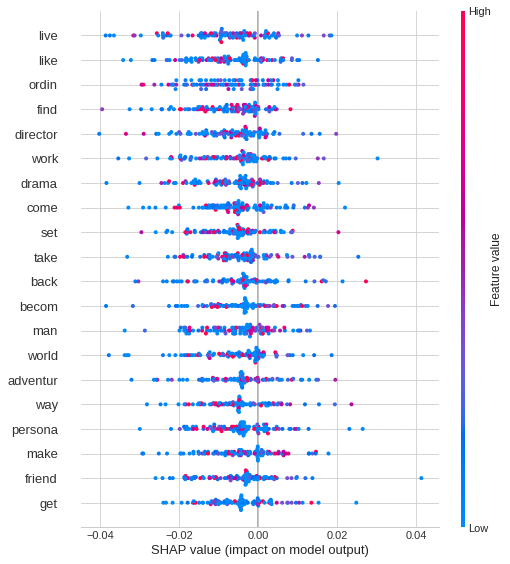

Romance


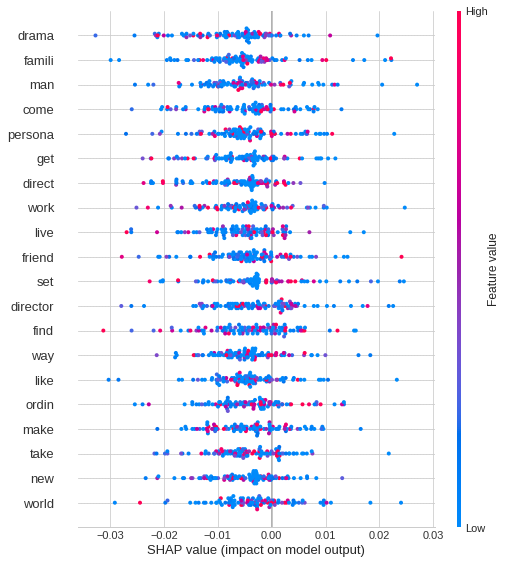

Science Fiction and Fantasy


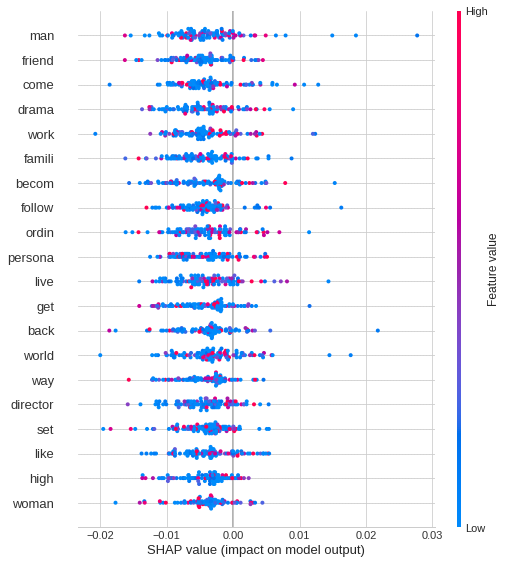

fresh


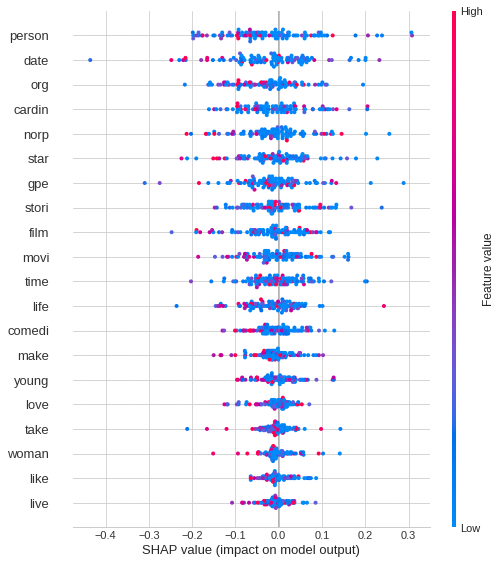

rotten


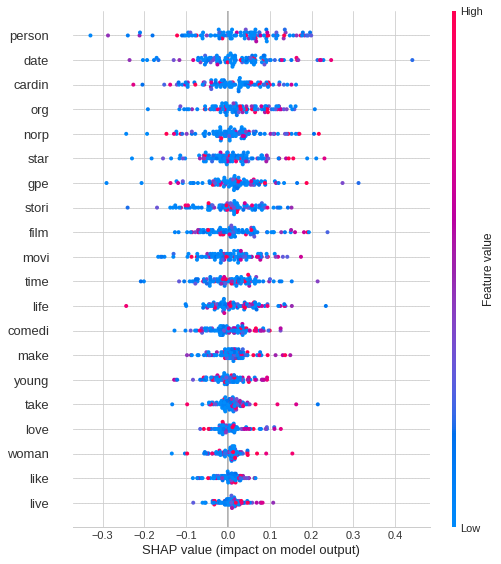

Other


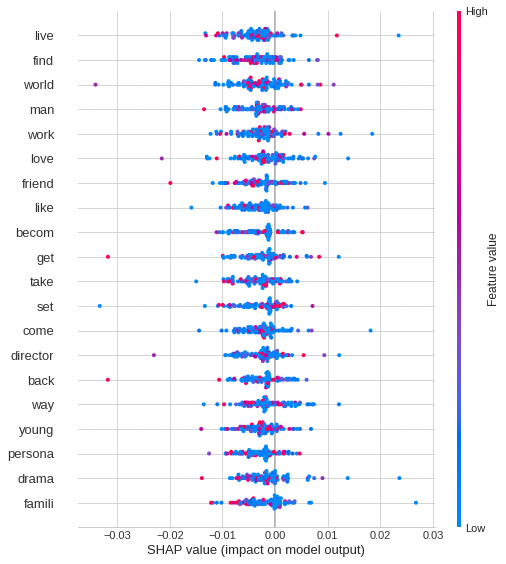

In [86]:
for i in range(14):
    print(y_df.columns[i])
    shap.summary_plot(shap_vals_cdf[i], cr_test_pad, feature_names=list(num2word.values()))

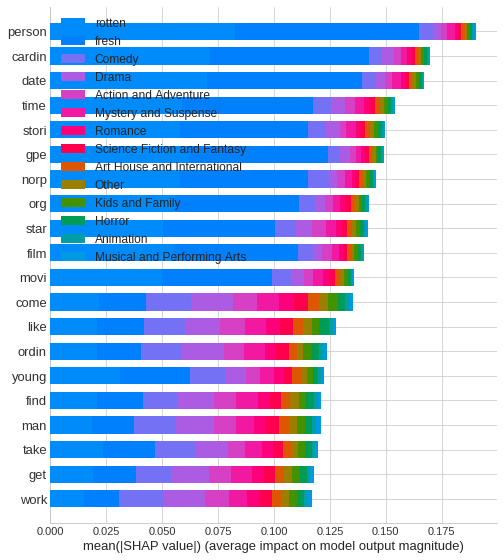

In [87]:
attrib_data = X_train_pad[:3000]
explainer = shap.DeepExplainer(model, attrib_data)
#num_explanations = 50
shap_vals_cdf = explainer.shap_values(dr_test_pad)
num2word = {}
for w in tokenizer.word_index.keys():
    num2word[tokenizer.word_index[w]] = w
x_test_words = np.stack([np.array(list(map(lambda x: num2word.get(x, "NONE"), dr_test_pad[i]))) for i in range(100)])
shap.summary_plot(shap_vals_cdf, class_names=y_df.columns, feature_names=list(num2word.values()))

Action and Adventure


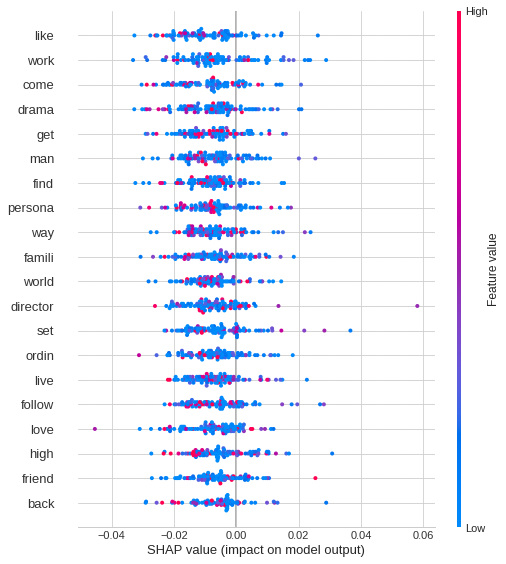

Animation


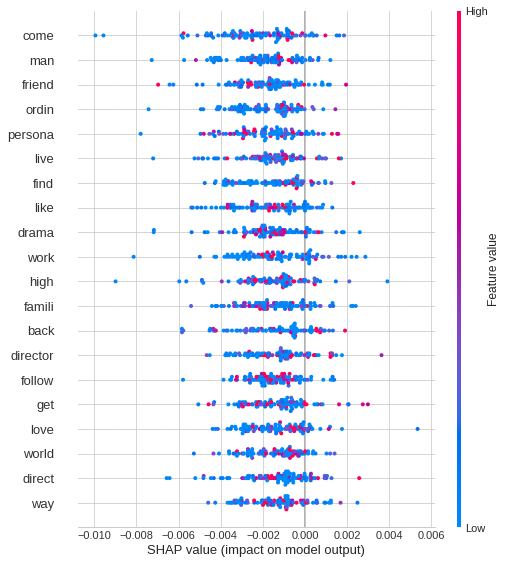

Art House and International


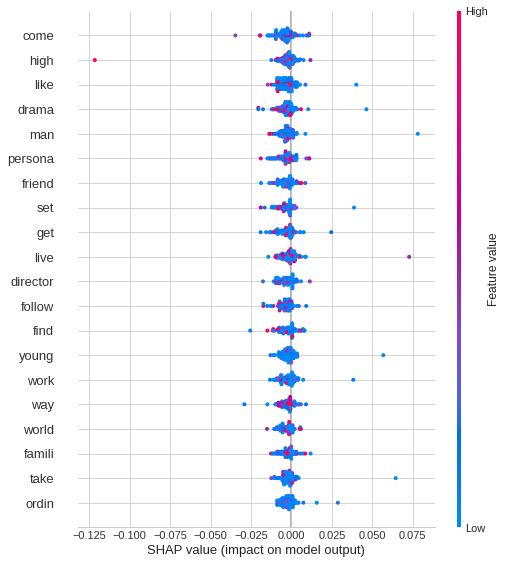

Comedy


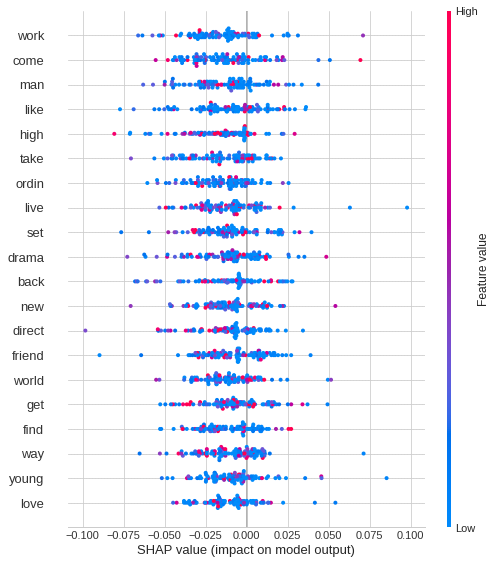

Drama


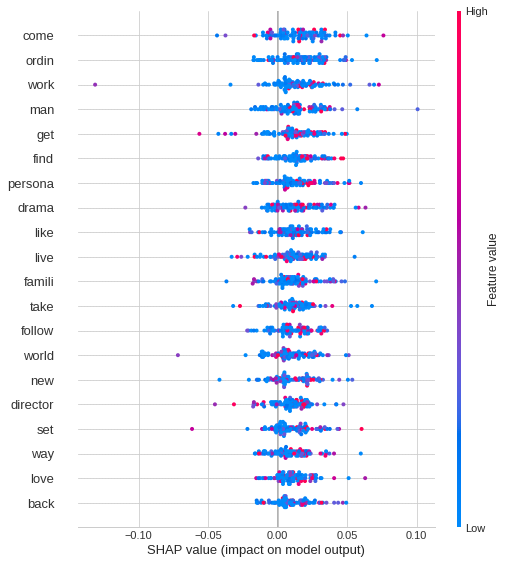

Horror


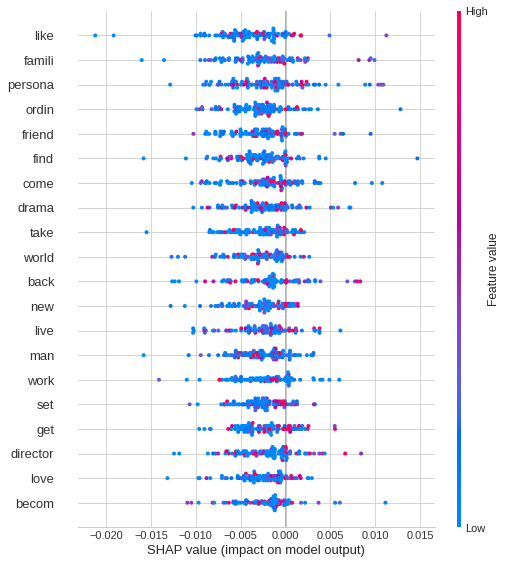

Kids and Family


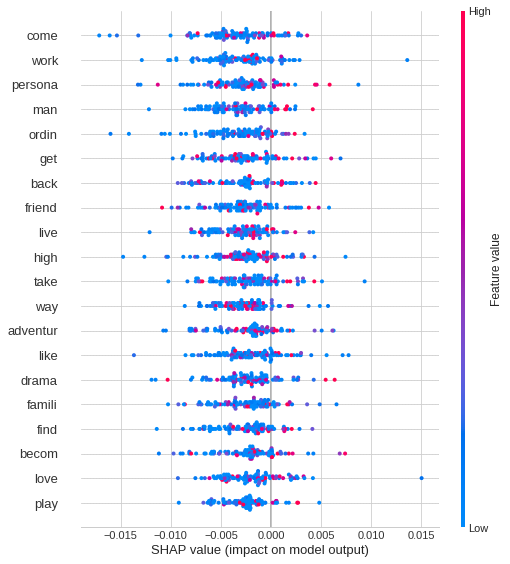

Musical and Performing Arts


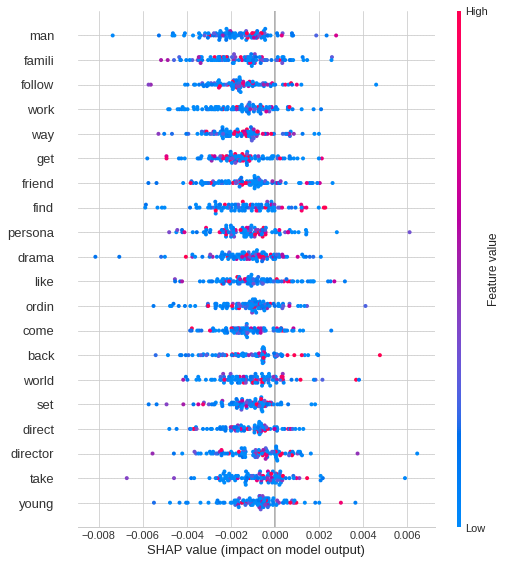

Mystery and Suspense


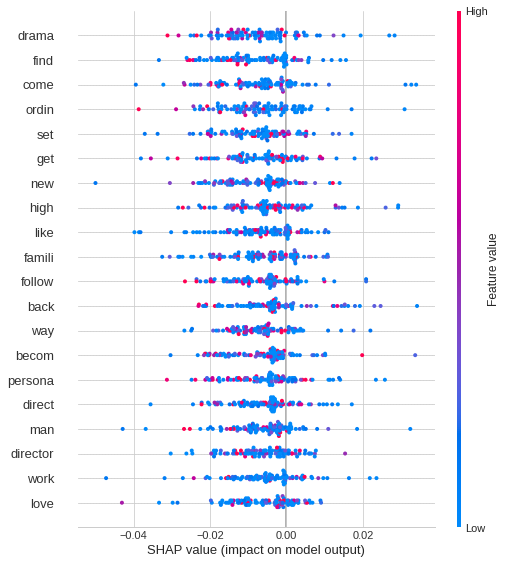

Romance


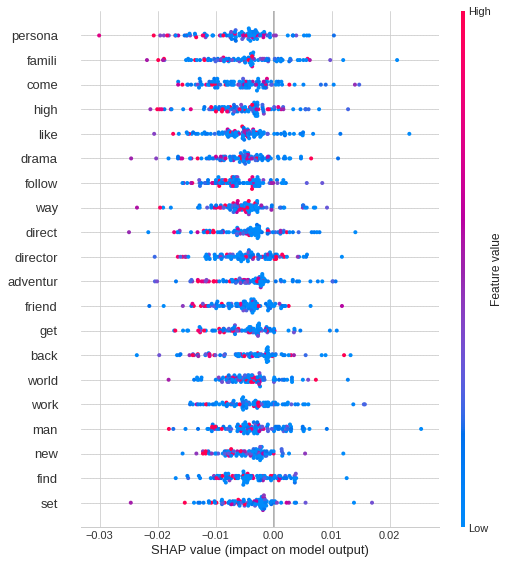

Science Fiction and Fantasy


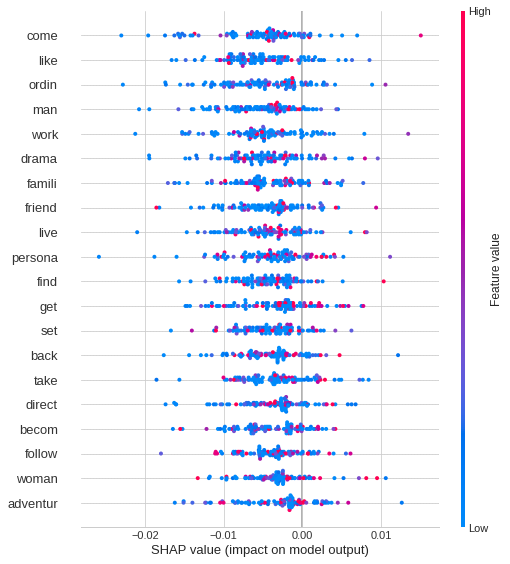

fresh


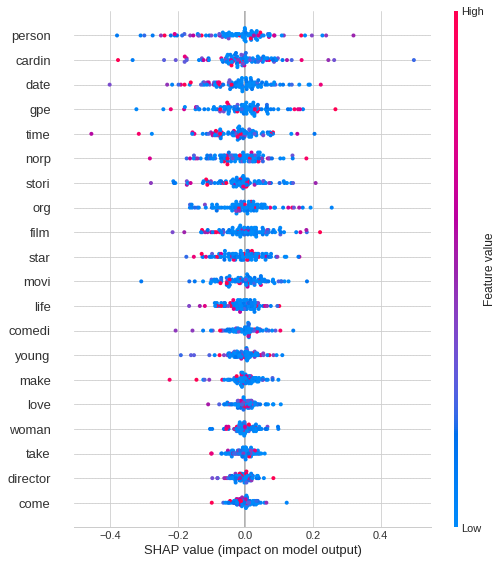

rotten


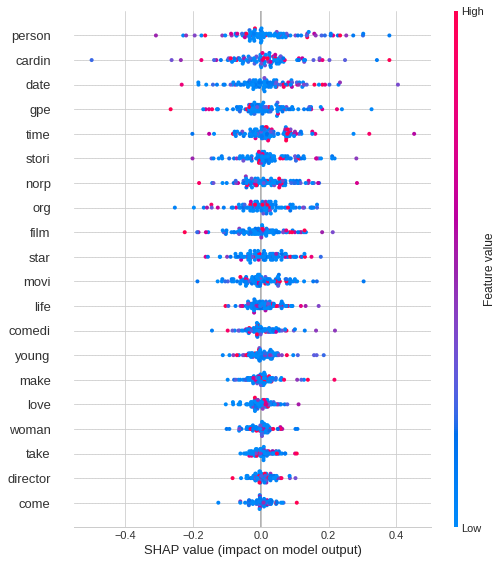

Other


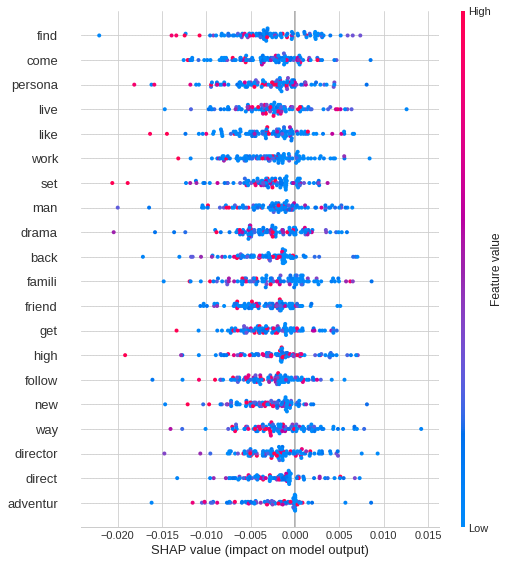

In [88]:
for i in range(14):
    print(y_df.columns[i])
    shap.summary_plot(shap_vals_cdf[i], dr_test_pad, feature_names=list(num2word.values()))

In [38]:
# init the JS visualization code
shap.initjs()
# create dict to invert word_idx k,v order
num2word = {}
for w in tokenizer.word_index.keys():
    num2word[tokenizer.word_index[w]] = w
x_test_words = np.stack([np.array(list(map(lambda x: num2word.get(x, "NONE"), selected_exp[i]))) for i in range(50)])

# plot the explanation of a given prediction
class_num = 0
input_num = 30
print(tags[0])
shap.force_plot(explainer.expected_value[class_num], shap_vals_cdf[class_num][input_num], x_test_words[input_num])

Action and Adventure


In [39]:
class_num = 1
input_num = 30
print(tags[1])
shap.force_plot(explainer.expected_value[class_num], shap_vals_cdf[class_num][input_num], x_test_words[input_num])

Animation


In [40]:
class_num = 2
input_num = 30
print(tags[2])
shap.force_plot(explainer.expected_value[class_num], shap_vals_cdf[class_num][input_num], x_test_words[input_num])

Art House and International


In [41]:
class_num = 3
input_num = 30
print(tags[3])
shap.force_plot(explainer.expected_value[class_num], shap_vals_cdf[class_num][input_num], x_test_words[input_num])

Comedy


In [42]:
class_num = 4
input_num = 30
print(tags[4])
shap.force_plot(explainer.expected_value[class_num], shap_vals_cdf[class_num][input_num], x_test_words[input_num])

Drama


In [43]:
class_num = 5
input_num = 30
print(tags[5])
shap.force_plot(explainer.expected_value[class_num], shap_vals_cdf[class_num][input_num], x_test_words[input_num])

Horror


In [44]:
class_num = 6
input_num = 30
print(tags[6])
shap.force_plot(explainer.expected_value[class_num], shap_vals_cdf[class_num][input_num], x_test_words[input_num])

Kids and Family


In [45]:
class_num = 7
input_num = 30
print(tags[7])
shap.force_plot(explainer.expected_value[class_num], shap_vals_cdf[class_num][input_num], x_test_words[input_num])

Musical and Performing Arts


In [46]:
class_num = 8
input_num = 30
print(tags[8])
shap.force_plot(explainer.expected_value[class_num], shap_vals_cdf[class_num][input_num], x_test_words[input_num])

Mystery and Suspense


In [47]:
class_num = 9
input_num = 30
print(tags[9])
shap.force_plot(explainer.expected_value[class_num], shap_vals_cdf[class_num][input_num], x_test_words[input_num])

Romance


In [48]:
class_num = 10
input_num = 30
print(tags[10])
shap.force_plot(explainer.expected_value[class_num], shap_vals_cdf[class_num][input_num], x_test_words[input_num])

Science Fiction and Fantasy


In [49]:
class_num = 11
input_num = 30
print(tags[11])
shap.force_plot(explainer.expected_value[class_num], shap_vals_cdf[class_num][input_num], x_test_words[input_num])

fresh


In [50]:
class_num = 12
input_num = 30
print(tags[12])
shap.force_plot(explainer.expected_value[class_num], shap_vals_cdf[class_num][input_num], x_test_words[input_num])

rotten


In [51]:
class_num = 13
input_num = 30
print(tags[13])
shap.force_plot(explainer.expected_value[class_num], shap_vals_cdf[class_num][input_num], x_test_words[input_num])

Other


In [52]:
# or access the embedding layer through the constructed model 
# first `0` refers to the position of embedding layer in the `model`
embeddings = model.layers[0].get_weights()[0]

In [53]:
type(embeddings)

numpy.ndarray

In [54]:
embeddings.shape

(19793, 100)

In [55]:
len(tokenizer.word_index)


19792

In [56]:
embeddings[0]

array([ 5.52950520e-03, -2.55027320e-04,  3.84644372e-03,  6.57119090e-04,
        3.84295615e-03, -5.88651688e-04,  4.41143615e-03, -2.46869936e-03,
       -3.26050003e-03, -1.85428513e-03, -3.33381235e-03, -3.30356020e-03,
        1.26931572e-03,  9.30682872e-04,  1.41483569e-03, -4.70464490e-03,
       -4.92357532e-04, -4.13114158e-03, -4.59817285e-03, -1.91618863e-03,
        2.94863363e-04,  5.53816091e-03,  5.69319469e-04,  2.21295306e-03,
       -3.36061371e-03, -7.71586318e-03,  2.82437610e-03,  4.52853681e-04,
        1.30235991e-02,  3.30463168e-04,  2.28183996e-03,  4.96012438e-03,
        5.81392692e-03, -4.37270757e-03,  4.08978574e-03, -1.74783485e-03,
       -3.46503058e-03,  3.99882765e-03, -4.18476434e-03, -4.21597296e-03,
        4.37165052e-03, -3.34987324e-03, -2.08973885e-03, -1.76832359e-03,
        5.40647481e-04,  1.99027127e-04,  5.74469380e-03, -5.15751541e-04,
        3.07432609e-03,  1.49550603e-03, -2.05730950e-03, -1.21250255e-02,
        3.42628779e-03,  

In [57]:
X_train_pad[0].shape

(579,)

In [58]:
X_train_pad[0]

array([2227,   95,   47, 2059,  336,   15,  187,  215, 2049, 5602,  142,
         41, 5139,  515,  294, 1812, 2725,  198,   39,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,   

In [59]:
word_lookup = {v:k for k,v in tokenizer.word_index.items()}

In [62]:
word_lookup[2227]

'refresh'

In [64]:
for i in X_train_pad[0]:
    if i != 0:
        print(word_lookup[i])
    else:
        print('<PAD>')

refresh
see
charact
practic
believ
make
entertain
watch
definit
faint
heart
woman
stack
odd
manag
stick
inde
give
back
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>
<PAD>